# Possíveis correlações entre variáveis e saúde mental

**Importante!** Este notebook foi desenvolvido como parte de um projeto de iniciação científica em 2024. Devido à natureza sensível dos dados contidos nos dataframes utilizados para as análises, optamos por omiti-los. Assim, o notebook não é executável e tem como finalidade exclusivamente a apresentação dos resultados.

---

## Configurações

In [ ]:
!pip install plot-likert

In [ ]:
!pip install statsmodels

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import csv
from IPython.core import display as ICD
import plot_likert
from scipy.stats import chi2_contingency
import plot_likert

from statsmodels.graphics.mosaicplot import mosaic


In [ ]:
sns.set_theme(style="whitegrid")
plt.rcParams['figure.dpi'] = 250
plt.rcParams['savefig.dpi'] = 250

In [ ]:
cores = [plot_likert.colors.TRANSPARENT,
        "red",
        "salmon",
        "lightgray",
        "cornflowerblue",
        "blue"]

### Leitura dos dados

In [ ]:
df['Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?'] = df['Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?'].replace('A USP mais beneficia do que prejudica a minha vida mental', 'A USP mais beneficia do que prejudica a minha saúde mental')

df['Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?'] = df['Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?'].str.replace('.', '', regex=True)

In [ ]:
df_graduacao['Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?'] = df_graduacao['Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?'].replace('A USP mais beneficia do que prejudica a minha vida mental', 'A USP mais beneficia do que prejudica a minha saúde mental')

df_graduacao['Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?'] = df_graduacao['Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?'].str.replace('.', '', regex=True)

In [ ]:
df_pos_graduacao['Impacto da USP (Saúde mental)'] = df_pos_graduacao['Impacto da USP (Saúde mental)'].replace('A USP mais beneficia do que prejudica a minha vida mental', 'A USP mais beneficia do que prejudica a minha saúde mental')


#df_pos_graduacao['Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?'] = df_pos_graduacao['Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?'].str.replace('.', '', regex=True)

In [ ]:
df_pos_doutorado['Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?'] = df_pos_doutorado['Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?'].replace('A USP mais beneficia do que prejudica a minha vida mental', 'A USP mais beneficia do que prejudica a minha saúde mental')

df['Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?'] = df['Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?'].replace('A USP mais beneficia do que prejudica a minha vida mental', 'A USP mais beneficia do que prejudica a minha saúde mental')

#df_pos_graduacao['Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?'] = df_pos_graduacao['Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?'].str.replace('.', '', regex=True)

In [ ]:
df_docentes['Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?'] = df_docentes['Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?'].replace('A USP mais beneficia do que prejudica a minha vida mental', 'A USP mais beneficia do que prejudica a minha saúde mental')

df_docentes['Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?'] = df_docentes['Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?'].str.replace('.', '', regex=True)

In [ ]:
df_funcionarios['Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?'] = df_funcionarios['Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?'].replace('A USP mais beneficia do que prejudica a minha vida mental', 'A USP mais beneficia do que prejudica a minha saúde mental')

df_funcionarios['Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?'] = df_funcionarios['Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?'].str.replace('.', '', regex=True)

In [ ]:
# PÓS GRAD COLUNAS QUE FORAM RENOMEADAS ANTES

df_pos_graduacao.rename(columns={"Impacto da USP (Saúde mental)": "Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?"}, inplace=True)

df_pos_graduacao.rename(columns={"Assédio na USP": "Você já experimentou pessoalmente algum tipo de discriminação, comportamento intimidador, hostilidade, bullying ou assédio moral na USP?"}, inplace=True)

df_pos_graduacao.rename(columns={"Quantidade de ocorrências (Assédio na USP)":"Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?"}, inplace=True)


df_pos_graduacao.rename(columns={"Experiência nos Ambientes Institucionais - Hostilidade (Escala Likert)": 'A partir da sua experiência dentro do campus da USP, como você sente os ambientes institucionais, na maior parte do tempo?'}, inplace=True)

In [ ]:
df_pos_graduacao["Você já experimentou pessoalmente algum tipo de discriminação, comportamento intimidador, hostilidade, bullying ou assédio moral na USP?"]

0       Sim, mas não afetou meu bem-estar ou minhas at...
1       Sim, e afetou meu bem-estar e/ou minhas ativid...
2                                  Prefiro não responder.
3                                                     Não
4                                                     Não
                              ...                        
1283    Sim, e afetou meu bem-estar e/ou minhas ativid...
1284                                                  Não
1285                                                  Não
1286    Sim, e afetou meu bem-estar e/ou minhas ativid...
1287                                                  Não
Name: Você já experimentou pessoalmente algum tipo de discriminação, comportamento intimidador, hostilidade, bullying ou assédio moral na USP?, Length: 1288, dtype: object

#### Visualização dos dados faltantes

In [ ]:
df.isnull().sum()

Unnamed: 0                                      0
Unnamed: 0.1.1.1.1.1                            0
Submitted At                                    0
Qual a sua posição principal na USP hoje?       0
Curso de pós-graduação                       5279
                                             ... 
Acessibilidade - Banheiros.                     0
Acessibilidade - Calçadas.                      0
Acessibilidade - Materiais instrucionais        0
Acessibilidade - Sites                          0
Unidades_padronizadas                           0
Length: 177, dtype: int64

In [ ]:
df_graduacao.isnull().sum()

Unnamed: 0                                                          0
Submitted At                                                        0
Qual a sua posição principal na USP hoje?                           0
Curso de pós-graduação                                           2998
Qual o seu ano de ingresso como aluno(a) de graduação na USP?       0
                                                                 ... 
Acessibilidade - Banheiros.                                         0
Acessibilidade - Calçadas.                                          0
Acessibilidade - Materiais instrucionais                            0
Acessibilidade - Sites                                              0
Unidades_padronizadas                                               0
Length: 115, dtype: int64

In [ ]:
df_pos_graduacao.isnull().sum()

Unnamed: 0                                                               0
Curso de pós-graduação                                                   0
Ano de ingresso (Pós-Grad)                                               0
Unidade                                                                  0
Experiência acadêmica (Grad, Pós-Grad, Pós-Doc) (Escala Likert)          0
                                                                        ..
Acessibilidade (Apenas PCD) - Materiais instrucionais (Escala Likert)    0
Acessibilidade (Apenas PCD) - Sites (Escala Likert)                      0
Unidades padronizadas                                                    0
Campus                                                                   0
Posição institucional                                                    0
Length: 97, dtype: int64

In [ ]:
df_pos_doutorado.isnull().sum()

Unnamed: 0.1                                                 0
Unnamed: 0                                                   0
Qual a sua posição principal na USP hoje?                    0
Qual o seu ano de ingresso como pós-doutorando(a) na USP?    0
Unidade                                                      0
                                                            ..
Acessibilidade - Materiais instrucionais                     0
Acessibilidade - Sites                                       0
Unidades_padronizadas                                        0
Campus                                                       0
Posição institucional                                        0
Length: 89, dtype: int64

In [ ]:
df_docentes.isnull().sum()

Unnamed: 0                                     0
Submitted At                                   0
Qual a sua posição principal na USP hoje?      0
Enquadramento                                999
Enquadramento.1                                0
                                            ... 
Acessibilidade - Banheiros.                    0
Acessibilidade - Calçadas.                     0
Acessibilidade - Materiais instrucionais       0
Acessibilidade - Sites                         0
Unidades_padronizadas                          0
Length: 123, dtype: int64

In [ ]:
df_funcionarios.isnull().sum()

Unnamed: 0                                                                        0
Submitted At                                                                      0
Qual a sua posição principal na USP hoje?                                         0
Enquadramento                                                                    26
Qual o seu ano de ingresso como servidor(a) técnico-administrativo(a) na USP?    27
                                                                                 ..
Acessibilidade - Banheiros.                                                       0
Acessibilidade - Calçadas.                                                        0
Acessibilidade - Materiais instrucionais                                          0
Acessibilidade - Sites                                                            0
Unidades_padronizadas                                                             0
Length: 102, dtype: int64

#### Função qui quadrado

In [ ]:
def qui_quadrado(df, var1, var2):

  chi = pd.crosstab(df[var1], df[var2]) # tabela de contingência
  chi_scores = chi2_contingency(chi) # cálculo de qui-quadrado

  scores = pd.Series(chi_scores[0]) # valor da estatística
  pvalues = pd.Series(chi_scores[1]) # p-valor

  # Criar dataframe com resultado
  d = {'Qui2': scores, 'p-Valor': pvalues}
  chi_squared = pd.DataFrame(d)

  # Renomear
  d = {0: var2}
  chi_squared = chi_squared.rename(d)

  return chi_squared

#### Função geradora de Tabela de Percentual

In [ ]:
def gera_tabela_percentual(df, var1, var2):
  aux = df.loc[:, [var1, var2]]
  aux[aux.isnull()] = 'Em branco'

  novo_dataframe = aux.value_counts().reset_index().sort_values(var1)
  novo_dataframe = novo_dataframe.rename({0: 'Respostas'}, axis = 1)

  for i in novo_dataframe.iloc[:,0].drop_duplicates():
    novo_dataframe.loc[novo_dataframe[var1] == i, 'Respostas'] /= \
    novo_dataframe.loc[novo_dataframe[var1] == i, 'Respostas'].sum()
  novo_dataframe

  novo_dataframe['Respostas'] *= 100
  novo_dataframe.reset_index(inplace = True)
  novo_dataframe = novo_dataframe.sort_values(by = 'Respostas', ascending = False)
  novo_dataframe = novo_dataframe.sort_values(by = var1)

  novo_dataframe = novo_dataframe.style.format({"Respostas": "{:,.2f}%"})
  return novo_dataframe

In [ ]:
def plotar_grafico_barras(data, y_column, x_column, hue_column, titulo, order=None):
    plt.figure(figsize=(12, 6))
    plt.rc('xtick', labelsize=12)

    ax = sns.barplot(data=data, y=y_column, x=x_column, hue=hue_column, order=order)

    for p in ax.patches:
        porcentagem = '{:.1f}%'.format(p.get_width())
        x = p.get_x() + p.get_width()
        y = p.get_y() + p.get_height()/2 + 0.03
        ax.annotate(porcentagem, (x, y))

    plt.xlabel("")
    plt.ylabel("")
    plt.title(titulo, size=12)
    plt.show()

## Variáveis saúde mental

Fixando a análise da percepção do impacto da usp na saúde mental e variando as questões referente à experiências pessoais
1. Você já experimentou pessoalmente algum tipo de discriminação, comportamento intimidador, hostilidade, bullying ou assédio moral na USP?


In [ ]:
rotulos_quebrados = [
    'A USP mais prejudica do que \nbeneficia a minha saúde mental',
    'A USP não prejudica nem beneficia a\nminha saúde mental, ou prejudica e\nbeneficia a minha saúde mental\nem mesmo grau',
    'A USP mais beneficia do que \nrejudica a minha saúde mental',
    'Prefiro não responder'
]

### Variável comum

In [ ]:
percepcao_saudemental = 'Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?'

In [ ]:
ordem_posicao = ['Aluno(a) de graduação', 'Aluno(a) de pós-graduação', 'Pós-doutorando(a)', 'Servidor(a) docente', 'Servidor(a) técnico(a)-administrativo(a)']
ordem_posicao = ordem_posicao[::-1]
ordem_posicao

['Servidor(a) técnico(a)-administrativo(a)',
 'Servidor(a) docente',
 'Pós-doutorando(a)',
 'Aluno(a) de pós-graduação',
 'Aluno(a) de graduação']

### Posição institucional - Amostra Geral

In [ ]:
# arrumando uma das respostas
df['Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?'] = df['Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?'].replace('A USP mais beneficia do que prejudica a minha vida mental', 'A USP mais beneficia do que prejudica a minha saúde mental')

In [ ]:
# variável comum de saúde mental
smental_posicaoinst_geral = df.groupby('Qual a sua posição principal na USP hoje?')[percepcao_saudemental].value_counts().unstack()

In [ ]:
tab_cruzada_posicao = pd.crosstab(df['Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?'], df['Qual a sua posição principal na USP hoje?'])

tab_cruzada_posicao.to_csv('cruzada_posicao_vs_saudemental.csv', index=False, decimal=',')
tab_cruzada_posicao

Qual a sua posição principal na USP hoje?,Aluno(a) de graduação,Aluno(a) de pós-graduação,Pós-doutorando(a),Servidor(a) docente,Servidor(a) técnico(a)-administrativo(a)
"Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?",,,,,
A USP mais beneficia do que prejudica a minha saúde mental,545,428,129,326,330
A USP mais prejudica do que beneficia a minha saúde mental,1309,318,35,257,202
"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",1089,506,137,353,352
Prefiro não responder,58,36,11,64,85


In [ ]:
aux = df.loc[:, ['Qual a sua posição principal na USP hoje?', 'Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?']]
aux[aux.isnull()] = 'Em branco'

posicao = aux.value_counts().reset_index().sort_values('Qual a sua posição principal na USP hoje?')
posicao = posicao.rename({0: 'Respostas'}, axis = 1)

for i in posicao.iloc[:,0].drop_duplicates():
  posicao.loc[posicao['Qual a sua posição principal na USP hoje?'] == i, 'Respostas'] /= \
  posicao.loc[posicao['Qual a sua posição principal na USP hoje?'] == i, 'Respostas'].sum()
posicao

posicao['Respostas'] *= 100
posicao.reset_index(inplace = True)
posicao = posicao.sort_values(by = 'Respostas', ascending = False)
posicao = posicao.sort_values(by = 'Qual a sua posição principal na USP hoje?')

posicao.style.format({"Respostas": "{:,.2f}%"})

,index,Qual a sua posição principal na USP hoje?,"Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?",Respostas
3,16,Aluno(a) de graduação,Prefiro não responder,1.93%
0,0,Aluno(a) de graduação,A USP mais prejudica do que beneficia a minha saúde mental,43.62%
1,1,Aluno(a) de graduação,"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",36.29%
2,2,Aluno(a) de graduação,A USP mais beneficia do que prejudica a minha saúde mental,18.16%
7,3,Aluno(a) de pós-graduação,"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",39.29%
5,9,Aluno(a) de pós-graduação,A USP mais prejudica do que beneficia a minha saúde mental,24.69%
6,4,Aluno(a) de pós-graduação,A USP mais beneficia do que prejudica a minha saúde mental,33.23%
4,17,Aluno(a) de pós-graduação,Prefiro não responder,2.80%
11,19,Pós-doutorando(a),Prefiro não responder,3.53%
8,18,Pós-doutorando(a),A USP mais prejudica do que beneficia a minha saúde mental,11.22%


In [ ]:
# "Gambiarra"
tabela=df

df.loc[df['Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?']=='A USP mais beneficia do que prejudica a minha vida mental','Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?']='A USP mais beneficia do que prejudica a minha saúde mental'

tabela['SaudeMental:Posdoc'] = df.loc[df['Qual a sua posição principal na USP hoje?']=='Pós-doutorando(a)','Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?']
tabela['SaudeMental:Func'] = df.loc[df['Qual a sua posição principal na USP hoje?']=='Servidor(a) técnico(a)-administrativo(a)','Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?']
tabela['SaudeMental:Doc'] = df.loc[df['Qual a sua posição principal na USP hoje?']=='Servidor(a) docente','Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?']
tabela['SaudeMental:Posgrad'] = df.loc[df['Qual a sua posição principal na USP hoje?']=='Aluno(a) de pós-graduação','Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?']
tabela['SaudeMental:Grad'] = df.loc[df['Qual a sua posição principal na USP hoje?']=='Aluno(a) de graduação','Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?']
tabela = tabela[['SaudeMental:Posdoc','SaudeMental:Func','SaudeMental:Doc','SaudeMental:Posgrad','SaudeMental:Grad']]


/home/jpirolla/anaconda3/lib/python3.10/site-packages/plot_likert/plot_likert.py:313: UserWarning: In your data, not all questions have the same number of responses. i.e., different numbers of people answered each question. Therefore, the percentages aren't directly comparable: X% for one question represents a different number of responses than X% for another question, yet they will appear the same in the percentage graph. This may be misleading to your reader.
  warn(


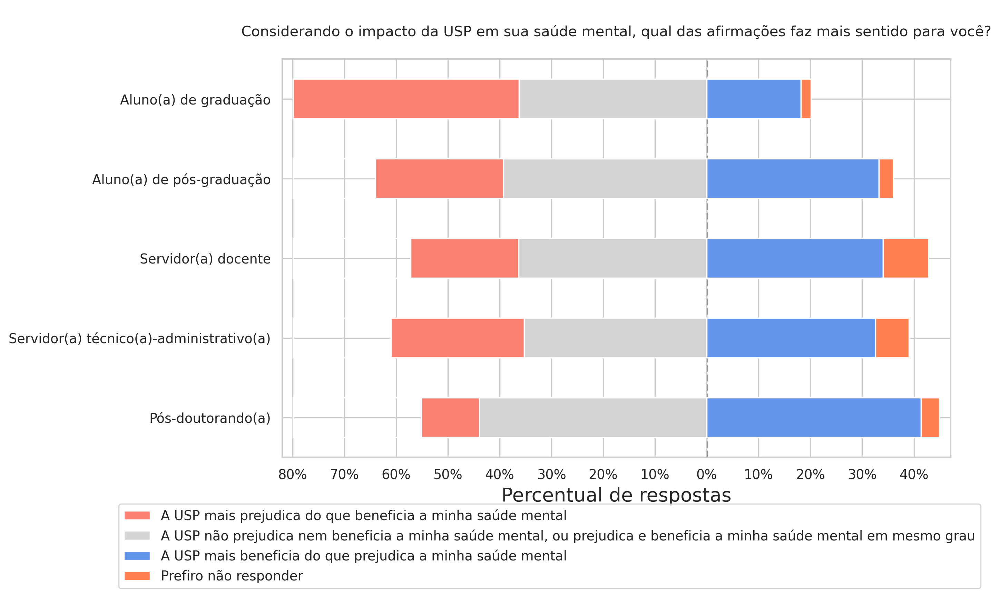

In [ ]:
cores =[
    plot_likert.colors.TRANSPARENT,
    "salmon",
    "lightgray",
    "cornflowerblue",
    "coral"
]

sns.set_style("whitegrid")
myscale5 = ['A USP mais prejudica do que beneficia a minha saúde mental','A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau','A USP mais beneficia do que prejudica a minha saúde mental', 'Prefiro não responder']


tabela = tabela.reindex(['SaudeMental:Grad','SaudeMental:Posgrad', 'SaudeMental:Func', 'SaudeMental:Doc', 'SaudeMental:Posdoc'], axis=1)


plt.rc('font', size=16)

ax = plot_likert.plot_likert(tabela[tabela!= 'NaN'],
                             myscale5, figsize=(10,6), title = '\nConsiderando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?\n', colors = cores , plot_percentage=True)

ax.legend(loc='upper center', bbox_to_anchor=(0.4, -0.1),
          fancybox=True, shadow=False, ncol=1)

ax.set_xlabel('Percentual de respostas')

ax.set_yticklabels(['Pós-doutorando(a)', 'Servidor(a) técnico(a)-administrativo(a)', 'Servidor(a) docente', 'Aluno(a) de pós-graduação', 'Aluno(a) de graduação'])


plt.show()

---

In [ ]:
sns.set_palette("viridis")

## Questão 01

**Você já experimentou pessoalmente algum tipo de discriminação, comportamento intimidador, hostilidade, bullying ou assédio moral na USP?**


In [ ]:
sns.set_palette("viridis")

In [ ]:
rotulos_quebrados2 = ['A USP mais prejudica do que \nbeneficia a minha saúde mental',
 'A USP não prejudica nem beneficia a\nminha saúde mental, ou prejudica e\nbeneficia a minha saúde mental\nem mesmo grau',
 'A USP mais beneficia do que \nrejudica a minha saúde mental']

In [ ]:
# Definir as cores desejadas
cores = ['#9ACD32', '#ADD8E6', '#FF6347', '#F8DA45', '#fcb7af', '#da82e9']


# Definir a ordem das respostas
ordem_respostas = ['A USP mais prejudica do que beneficia a minha saúde mental',
                   'A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau',
                   'A USP mais beneficia do que prejudica a minha saúde mental', 'Prefiro não responder']


### Amostra Geral

#### Tabela cruzada
-  fornece uma visão geral da contagem de observações para as combinações dessas duas variáveis.

In [ ]:
# reorganizando a ordem das linhas e colunas
row_order = ['A USP mais prejudica do que beneficia a minha saúde mental',
             'A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau',
             'A USP mais beneficia do que prejudica a minha saúde mental', 'Prefiro não responder']

col_order = ['Sim, e afetou meu bem-estar e/ou minhas atividades na USP.',
    'Sim, mas não afetou meu bem-estar ou minhas atividades na USP.',
    'Não', 'Prefiro não responder.']


In [ ]:
tabcruzada_hostilidade_geral = pd.crosstab(df['Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?'], df['Você já experimentou pessoalmente algum tipo de discriminação, comportamento intimidador, hostilidade, bullying ou assédio moral na USP?']).reindex(index=row_order, columns=col_order)
tabcruzada_hostilidade_geral

"Você já experimentou pessoalmente algum tipo de discriminação, comportamento intimidador, hostilidade, bullying ou assédio moral na USP?","Sim, e afetou meu bem-estar e/ou minhas atividades na USP.","Sim, mas não afetou meu bem-estar ou minhas atividades na USP.",Não,Prefiro não responder.
"Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?",,,,
A USP mais prejudica do que beneficia a minha saúde mental,831,283,896,111
"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",443,349,1535,110
A USP mais beneficia do que prejudica a minha saúde mental,233,269,1203,53
Prefiro não responder,54,39,146,15


#### Mosaic Plot

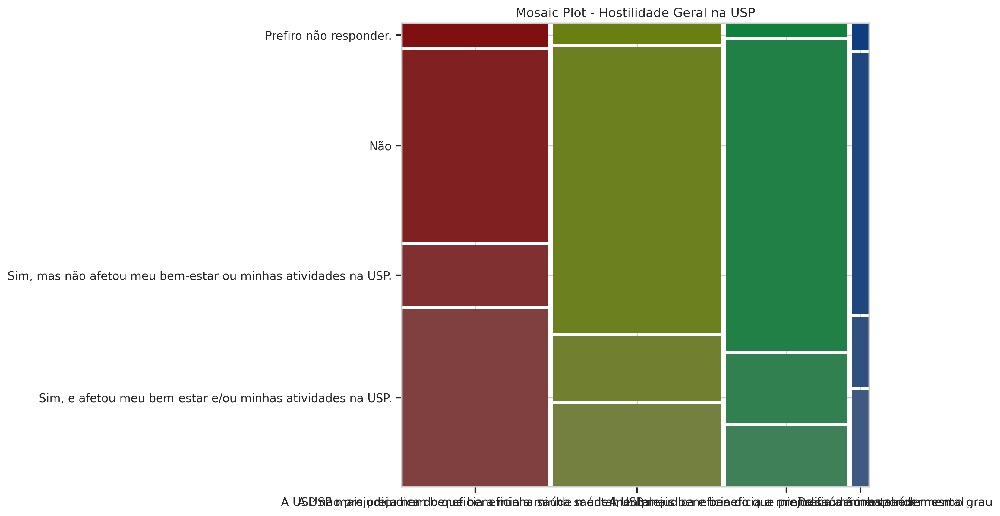

In [ ]:
# Criar o mosaico plot
fig, ax = plt.subplots(figsize=(8, 8))
mosaic(tabcruzada_hostilidade_geral.stack(), ax=ax, labelizer=lambda k: '',gap=0.01)
plt.title('Mosaic Plot - Hostilidade Geral na USP')
plt.show()

#### Tabela em termos percentuais
- Proporciona uma visão mais detalhada das respostas em relação a essa variável específica
- Calcula a porcentagem de respostas para cada categoria única na primeira coluna selecionada.
- A tabela resultante (hostilidade) mostra as categorias, as porcentagens de respostas para cada categoria e o número total de respostas para essas categorias.

In [ ]:
hostilidade_geral = gera_tabela_percentual(df, 'Você já experimentou pessoalmente algum tipo de discriminação, comportamento intimidador, hostilidade, bullying ou assédio moral na USP?', percepcao_saudemental)
hostilidade_geral = hostilidade_geral.data

In [ ]:
df['Você já experimentou pessoalmente algum tipo de discriminação, comportamento intimidador, hostilidade, bullying ou assédio moral na USP?'].isnull().sum()

0

In [ ]:
import pandas as pd

def gera_tabela_percentual(df, var1, var2, ordem_respostas):
    aux = df.loc[:, [var1, var2]]
    aux[aux.isnull()] = 'Em branco'

    # Criar uma coluna categórica com a ordem desejada
    aux[var1] = pd.Categorical(aux[var1], categories=ordem_respostas, ordered=True)

    novo_dataframe = aux.value_counts().reset_index().sort_values(var1)
    novo_dataframe = novo_dataframe.rename({0: 'Respostas'}, axis=1)

    for i in novo_dataframe.iloc[:, 0].drop_duplicates():
        novo_dataframe.loc[novo_dataframe[var1] == i, 'Respostas'] /= \
        novo_dataframe.loc[novo_dataframe[var1] == i, 'Respostas'].sum()

    novo_dataframe['Respostas'] *= 100
    novo_dataframe.reset_index(inplace=True)
    novo_dataframe = novo_dataframe.sort_values(by='Respostas', ascending=False)
    novo_dataframe = novo_dataframe.sort_values(by=var1)

    novo_dataframe = novo_dataframe.style.format({"Respostas": "{:,.2f}%"})
    return novo_dataframe

In [ ]:
ordem_legenda = ['Sim, e afetou meu bem-estar e/ou minhas atividades na USP.',
                 'Sim, mas não afetou meu bem-estar ou minhas atividades na USP.',
                 'Prefiro não responder',
                 'Não']

In [ ]:
hostilidade_geral = gera_tabela_percentual(df, 'Você já experimentou pessoalmente algum tipo de discriminação, comportamento intimidador, hostilidade, bullying ou assédio moral na USP?', percepcao_saudemental, ordem_respostas=ordem_legenda)
hostilidade_geral = hostilidade_geral.data

In [ ]:
hostilidade_geral

,index,"Você já experimentou pessoalmente algum tipo de discriminação, comportamento intimidador, hostilidade, bullying ou assédio moral na USP?","Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?",Respostas
0,3,"Sim, e afetou meu bem-estar e/ou minhas ativid...",A USP mais prejudica do que beneficia a minha ...,53.235106
1,4,"Sim, e afetou meu bem-estar e/ou minhas ativid...",A USP não prejudica nem beneficia a minha saúd...,28.379244
2,8,"Sim, e afetou meu bem-estar e/ou minhas ativid...",A USP mais beneficia do que prejudica a minha ...,14.926329
3,10,"Sim, e afetou meu bem-estar e/ou minhas ativid...",Prefiro não responder,3.459321
4,5,"Sim, mas não afetou meu bem-estar ou minhas at...",A USP não prejudica nem beneficia a minha saúd...,37.127660
5,6,"Sim, mas não afetou meu bem-estar ou minhas at...",A USP mais prejudica do que beneficia a minha ...,30.106383
6,7,"Sim, mas não afetou meu bem-estar ou minhas at...",A USP mais beneficia do que prejudica a minha ...,28.617021
7,11,"Sim, mas não afetou meu bem-estar ou minhas at...",Prefiro não responder,4.148936
8,0,Não,A USP não prejudica nem beneficia a minha saúd...,40.608466
9,1,Não,A USP mais beneficia do que prejudica a minha ...,31.825397


In [ ]:
# forçando o df ter uma ordem específica par aque a legenda siga essa ordem

# Definir a ordem desejada
ordem_legenda = ['Sim, e afetou meu bem-estar e/ou minhas atividades na USP.',
                 'Sim, mas não afetou meu bem-estar ou minhas atividades na USP.',
                 'Prefiro não responder',
                 'Não']

# Criar uma categoria ordenada com base na lista
categoria_ordem = pd.Categorical(hostilidade_geral['Você já experimentou pessoalmente algum tipo de discriminação, comportamento intimidador, hostilidade, bullying ou assédio moral na USP?'], categories=ordem_legenda, ordered=True)

# Substituir a coluna no DataFrame pela categoria ordenada
hostilidade_geral['Você já experimentou pessoalmente algum tipo de discriminação, comportamento intimidador, hostilidade, bullying ou assédio moral na USP?'] = categoria_ordem

# Ordenar o DataFrame pela coluna usando a categoria ordenada
hostilidade_geral = hostilidade_geral.sort_values(by='Você já experimentou pessoalmente algum tipo de discriminação, comportamento intimidador, hostilidade, bullying ou assédio moral na USP?')

hostilidade_geral

,index,"Você já experimentou pessoalmente algum tipo de discriminação, comportamento intimidador, hostilidade, bullying ou assédio moral na USP?","Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?",Respostas
8,3,"Sim, e afetou meu bem-estar e/ou minhas ativid...",A USP mais prejudica do que beneficia a minha ...,53.235106
9,4,"Sim, e afetou meu bem-estar e/ou minhas ativid...",A USP não prejudica nem beneficia a minha saúd...,28.379244
10,8,"Sim, e afetou meu bem-estar e/ou minhas ativid...",A USP mais beneficia do que prejudica a minha ...,14.926329
11,12,"Sim, e afetou meu bem-estar e/ou minhas ativid...",Prefiro não responder,3.459321
12,5,"Sim, mas não afetou meu bem-estar ou minhas at...",A USP não prejudica nem beneficia a minha saúd...,37.127660
13,6,"Sim, mas não afetou meu bem-estar ou minhas at...",A USP mais prejudica do que beneficia a minha ...,30.106383
14,7,"Sim, mas não afetou meu bem-estar ou minhas at...",A USP mais beneficia do que prejudica a minha ...,28.617021
15,14,"Sim, mas não afetou meu bem-estar ou minhas at...",Prefiro não responder,4.148936
0,0,Não,A USP não prejudica nem beneficia a minha saúd...,40.608466
1,1,Não,A USP mais beneficia do que prejudica a minha ...,31.825397


In [ ]:
df['Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?'].unique()

array(['A USP mais prejudica do que beneficia a minha saúde mental',
       'A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau',
       'A USP mais beneficia do que prejudica a minha saúde mental',
       'Prefiro não responder'], dtype=object)

In [ ]:
df['Você já experimentou pessoalmente algum tipo de discriminação, comportamento intimidador, hostilidade, bullying ou assédio moral na USP?'].unique()

array(['Prefiro não responder.', 'Não',
       'Sim, e afetou meu bem-estar e/ou minhas atividades na USP.',
       'Sim, mas não afetou meu bem-estar ou minhas atividades na USP.'],
      dtype=object)

#### Visualização

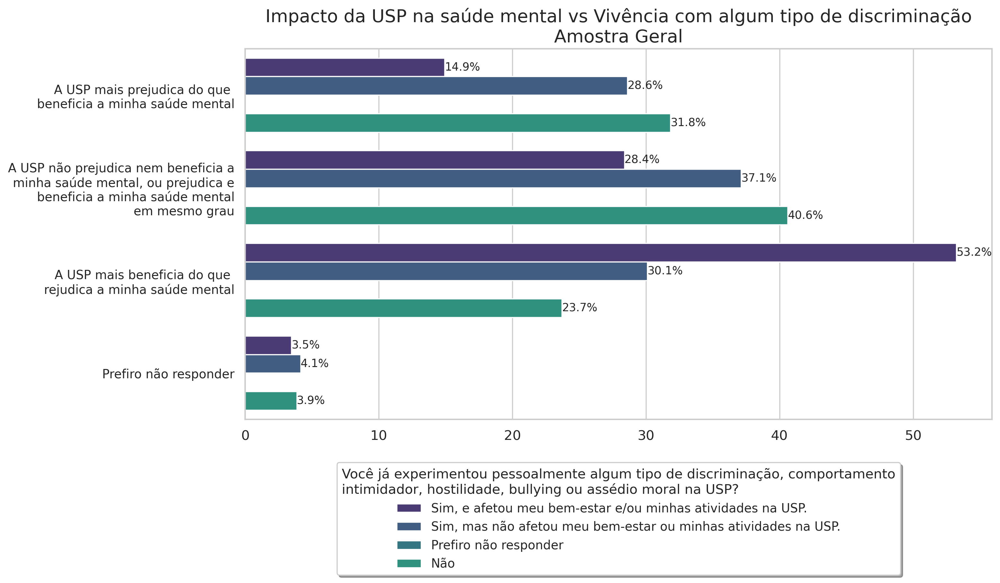

In [ ]:
ordem_legenda = ['Sim, e afetou meu bem-estar e/ou minhas atividades na USP.',
                 'Sim, mas não afetou meu bem-estar ou minhas atividades na USP.',
                 'Prefiro não responder.',
                 'Não']

plt.figure(figsize=(12, 6))
plt.rc('xtick', labelsize=12)


# Criar o gráfico de barras
ax = sns.barplot(data=hostilidade_geral, y='Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?',
                 x='Respostas', hue='Você já experimentou pessoalmente algum tipo de discriminação, comportamento intimidador, hostilidade, bullying ou assédio moral na USP?',
                 order=  ['A USP mais beneficia do que prejudica a minha saúde mental', 'A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau','A USP mais prejudica do que beneficia a minha saúde mental', 'Prefiro não responder'])

# Adicionar rótulos de porcentagem às barras
for p in ax.patches:
    porcentagem = '{:.1f}%'.format(p.get_width())
    x = p.get_x() + p.get_width()
    y = p.get_y() + p.get_height()/2 + 0.03
    ax.annotate(porcentagem, (x, y), fontsize = 10)

plt.xlabel("")
plt.ylabel("")
plt.title("Impacto da USP na saúde mental vs Vivência com algum tipo de discriminação\nAmostra Geral", size=16)
ax.set_yticklabels(rotulos_quebrados)
legenda = plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=1)#, labels=ordem_legenda)
legenda.set_title('Você já experimentou pessoalmente algum tipo de discriminação, comportamento\nintimidador, hostilidade, bullying ou assédio moral na USP?')
plt.show()

#### Qui quadrado

In [ ]:
qui_quadrado(df, 'Você já experimentou pessoalmente algum tipo de discriminação, comportamento intimidador, hostilidade, bullying ou assédio moral na USP?', 'Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?')

,Qui2,p-Valor
"Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?",476.793526,5.332174e-97


### Graduação

#### Tabela cruzada
-  fornece uma visão geral da contagem de observações para as combinações dessas duas variáveis.

In [ ]:
df['Qual a sua posição principal na USP hoje?'].unique()

array(['Aluno(a) de graduação', 'Aluno(a) de pós-graduação',
       'Pós-doutorando(a)', 'Servidor(a) docente',
       'Servidor(a) técnico(a)-administrativo(a)'], dtype=object)

In [ ]:
tabcruzada_hostilidade_grad = pd.crosstab(df_graduacao['Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?'], df_graduacao['Você já experimentou pessoalmente algum tipo de discriminação, comportamento intimidador, hostilidade, bullying ou assédio moral na USP?']).reindex(index=row_order, columns=col_order)
tabcruzada_hostilidade_grad

"Você já experimentou pessoalmente algum tipo de discriminação, comportamento intimidador, hostilidade, bullying ou assédio moral na USP?","Sim, e afetou meu bem-estar e/ou minhas atividades na USP.","Sim, mas não afetou meu bem-estar ou minhas atividades na USP.",Não,Prefiro não responder.
"Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?",,,,
A USP mais prejudica do que beneficia a minha saúde mental,402,176,659,72
"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",124,120,816,29
A USP mais beneficia do que prejudica a minha saúde mental,59,55,419,12
Prefiro não responder,8,6,43,1


#### Tabela em termos percentuais
- Proporciona uma visão mais detalhada das respostas em relação a essa variável específica
- Calcula a porcentagem de respostas para cada categoria única na primeira coluna selecionada.
- A tabela resultante (hostilidade) mostra as categorias, as porcentagens de respostas para cada categoria e o número total de respostas para essas categorias.

In [ ]:
hostilidade_grad = gera_tabela_percentual(df_graduacao, 'Você já experimentou pessoalmente algum tipo de discriminação, comportamento intimidador, hostilidade, bullying ou assédio moral na USP?', percepcao_saudemental, ordem_respostas=ordem_legenda)
hostilidade_grad

,index,"Você já experimentou pessoalmente algum tipo de discriminação, comportamento intimidador, hostilidade, bullying ou assédio moral na USP?","Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?",Respostas
0,3,"Sim, e afetou meu bem-estar e/ou minhas atividades na USP.",A USP mais prejudica do que beneficia a minha saúde mental,67.79%
1,5,"Sim, e afetou meu bem-estar e/ou minhas atividades na USP.","A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",20.91%
2,8,"Sim, e afetou meu bem-estar e/ou minhas atividades na USP.",A USP mais beneficia do que prejudica a minha saúde mental,9.95%
3,13,"Sim, e afetou meu bem-estar e/ou minhas atividades na USP.",Prefiro não responder,1.35%
4,4,"Sim, mas não afetou meu bem-estar ou minhas atividades na USP.",A USP mais prejudica do que beneficia a minha saúde mental,49.30%
5,6,"Sim, mas não afetou meu bem-estar ou minhas atividades na USP.","A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",33.61%
6,9,"Sim, mas não afetou meu bem-estar ou minhas atividades na USP.",A USP mais beneficia do que prejudica a minha saúde mental,15.41%
7,14,"Sim, mas não afetou meu bem-estar ou minhas atividades na USP.",Prefiro não responder,1.68%
8,7,Prefiro não responder.,A USP mais prejudica do que beneficia a minha saúde mental,63.16%
9,11,Prefiro não responder.,"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",25.44%


In [ ]:
hostilidade_grad = hostilidade_grad.data

#### Visualização

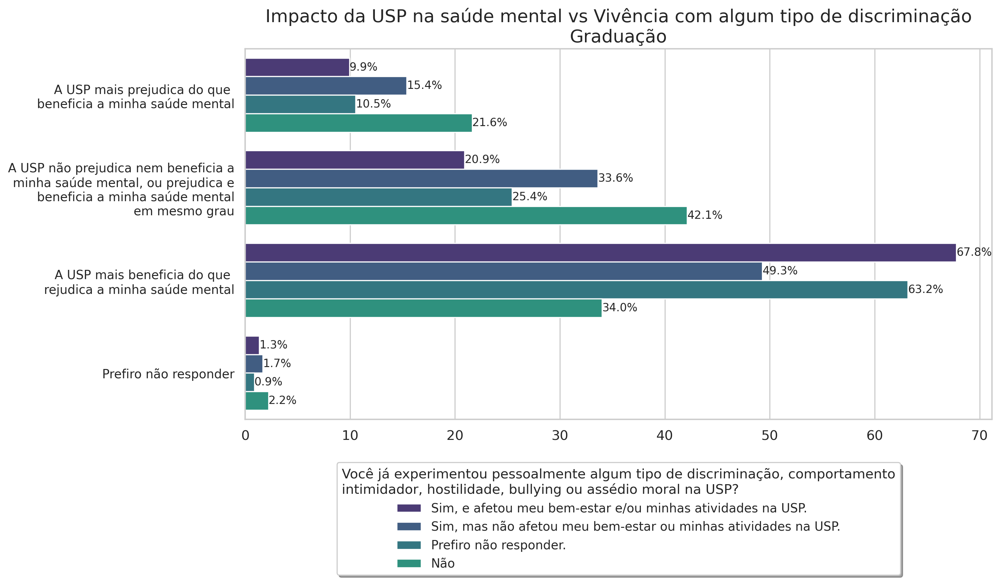

In [ ]:
plt.figure(figsize = (12,6))
plt.rc('xtick', labelsize=12)

ax = sns.barplot(data = hostilidade_grad, y= 'Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?',\
                 x = 'Respostas', hue = 'Você já experimentou pessoalmente algum tipo de discriminação, comportamento intimidador, hostilidade, bullying ou assédio moral na USP?', order=  ['A USP mais beneficia do que prejudica a minha saúde mental', 'A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau','A USP mais prejudica do que beneficia a minha saúde mental', 'Prefiro não responder'])
for p in ax.patches:
        porcentagem = '{:.1f}%'.format(p.get_width())
        x = p.get_x() + p.get_width()
        y = p.get_y() + p.get_height()/2 + 0.03
        ax.annotate(porcentagem, (x, y), fontsize = 10)

plt.xlabel("")
plt.ylabel("")
plt.title("Impacto da USP na saúde mental vs Vivência com algum tipo de discriminação\nGraduação",size = 16)
ax.set_yticklabels(rotulos_quebrados)
legenda = plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=1)
legenda.set_title('Você já experimentou pessoalmente algum tipo de discriminação, comportamento\nintimidador, hostilidade, bullying ou assédio moral na USP?')
plt.show()

In [ ]:
qui_quadrado(df_graduacao, 'Você já experimentou pessoalmente algum tipo de discriminação, comportamento intimidador, hostilidade, bullying ou assédio moral na USP?', 'Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?')

,Qui2,p-Valor
"Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?",236.858454,5.904967e-46


### Pós graduação

#### Tabela cruzada

In [ ]:
tabcruzada_hostilidade_posgrad = pd.crosstab(df_pos_graduacao["Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?"], df_pos_graduacao["Você já experimentou pessoalmente algum tipo de discriminação, comportamento intimidador, hostilidade, bullying ou assédio moral na USP?"]).reindex(index=row_order, columns=col_order)

tabcruzada_hostilidade_posgrad

"Você já experimentou pessoalmente algum tipo de discriminação, comportamento intimidador, hostilidade, bullying ou assédio moral na USP?","Sim, e afetou meu bem-estar e/ou minhas atividades na USP.","Sim, mas não afetou meu bem-estar ou minhas atividades na USP.",Não,Prefiro não responder.
"Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?",,,,
A USP mais prejudica do que beneficia a minha saúde mental,143,37,118,11
"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",78,60,331,23
A USP mais beneficia do que prejudica a minha saúde mental,40,44,327,6
Prefiro não responder,2,2,31,1


#### Tabela em termos percentuais

In [ ]:
hostilidade_posgrad = gera_tabela_percentual(df_pos_graduacao,'Você já experimentou pessoalmente algum tipo de discriminação, comportamento intimidador, hostilidade, bullying ou assédio moral na USP?', "Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?",ordem_respostas=ordem_legenda)
hostilidade_posgrad

,index,"Você já experimentou pessoalmente algum tipo de discriminação, comportamento intimidador, hostilidade, bullying ou assédio moral na USP?","Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?",Respostas
0,2,"Sim, e afetou meu bem-estar e/ou minhas atividades na USP.",A USP mais prejudica do que beneficia a minha saúde mental,54.37%
1,4,"Sim, e afetou meu bem-estar e/ou minhas atividades na USP.","A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",29.66%
2,7,"Sim, e afetou meu bem-estar e/ou minhas atividades na USP.",A USP mais beneficia do que prejudica a minha saúde mental,15.21%
3,13,"Sim, e afetou meu bem-estar e/ou minhas atividades na USP.",Prefiro não responder,0.76%
4,5,"Sim, mas não afetou meu bem-estar ou minhas atividades na USP.","A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",41.96%
5,6,"Sim, mas não afetou meu bem-estar ou minhas atividades na USP.",A USP mais beneficia do que prejudica a minha saúde mental,30.77%
6,8,"Sim, mas não afetou meu bem-estar ou minhas atividades na USP.",A USP mais prejudica do que beneficia a minha saúde mental,25.87%
7,14,"Sim, mas não afetou meu bem-estar ou minhas atividades na USP.",Prefiro não responder,1.40%
8,10,Prefiro não responder.,"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",56.10%
9,11,Prefiro não responder.,A USP mais prejudica do que beneficia a minha saúde mental,26.83%


In [ ]:
hostilidade_posgrad = hostilidade_posgrad.data

#### Visualização em gráfico de barras

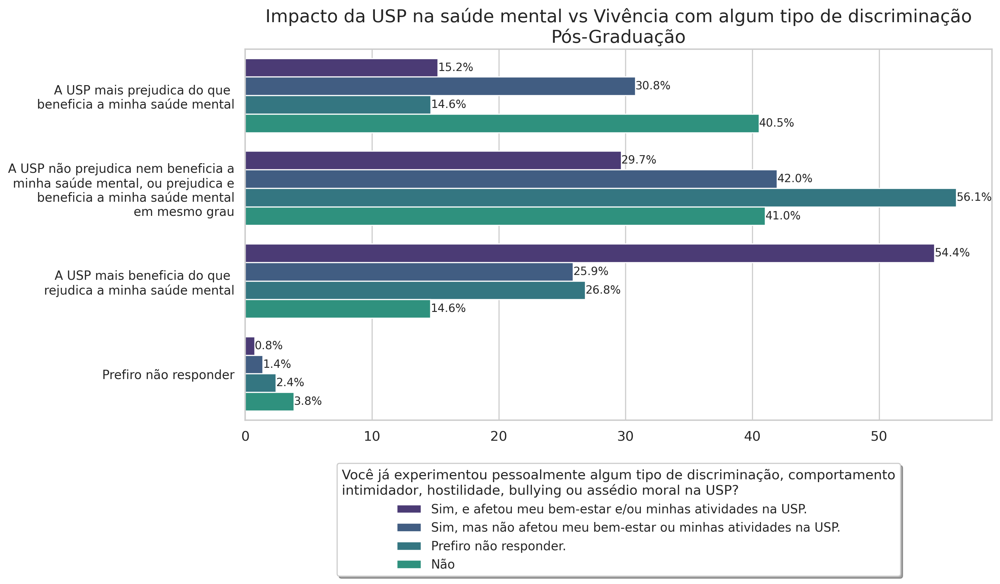

In [ ]:
plt.figure(figsize = (12,6))
plt.rc('xtick', labelsize=12)

ax = sns.barplot(data = hostilidade_posgrad, y= "Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?",\
                 x = 'Respostas', hue = 'Você já experimentou pessoalmente algum tipo de discriminação, comportamento intimidador, hostilidade, bullying ou assédio moral na USP?', order=  ['A USP mais beneficia do que prejudica a minha saúde mental', 'A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau','A USP mais prejudica do que beneficia a minha saúde mental', 'Prefiro não responder'])
for p in ax.patches:
        porcentagem = '{:.1f}%'.format(p.get_width())
        x = p.get_x() + p.get_width()
        y = p.get_y() + p.get_height()/2 + 0.03
        ax.annotate(porcentagem, (x, y), fontsize = 10)

plt.xlabel("")
plt.ylabel("")
plt.title("Impacto da USP na saúde mental vs Vivência com algum tipo de discriminação\nPós-Graduação",size = 16)
ax.set_yticklabels(rotulos_quebrados)
legenda = plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=1)
legenda.set_title('Você já experimentou pessoalmente algum tipo de discriminação, comportamento\nintimidador, hostilidade, bullying ou assédio moral na USP?')
plt.show()

#### Qui quadrado

In [ ]:
qui_quadrado(df_pos_graduacao, 'Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?', 'Você já experimentou pessoalmente algum tipo de discriminação, comportamento intimidador, hostilidade, bullying ou assédio moral na USP?')

,Qui2,p-Valor
"Você já experimentou pessoalmente algum tipo de discriminação, comportamento intimidador, hostilidade, bullying ou assédio moral na USP?",190.603583,1.711243e-32


### Pós doutorado

In [ ]:
df_pos_doutorado['Você já experimentou pessoalmente algum tipo de discriminação, comportamento intimidador, hostilidade, bullying ou assédio moral na USP?'].unique()

array(['Não',
       'Sim, e afetou meu bem-estar e/ou minhas atividades na USP.',
       'Sim, mas não afetou meu bem-estar ou minhas atividades na USP.',
       'Sim', 'Prefiro não responder.'], dtype=object)

In [ ]:
tabcruzada_hostilidade_posdoc = pd.crosstab(df_pos_doutorado['Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?'], df_pos_doutorado['Você já experimentou pessoalmente algum tipo de discriminação, comportamento intimidador, hostilidade, bullying ou assédio moral na USP?']).reindex(index=row_order, columns=col_order)
tabcruzada_hostilidade_posdoc

"Você já experimentou pessoalmente algum tipo de discriminação, comportamento intimidador, hostilidade, bullying ou assédio moral na USP?","Sim, e afetou meu bem-estar e/ou minhas atividades na USP.","Sim, mas não afetou meu bem-estar ou minhas atividades na USP.",Não,Prefiro não responder.
"Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?",,,,
A USP mais prejudica do que beneficia a minha saúde mental,16,4,11,3
"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",30,16,78,9
A USP mais beneficia do que prejudica a minha saúde mental,6,17,98,7
Prefiro não responder,1,0,10,0


#### Tabela em termos percentuais

In [ ]:
hostilidade_posdoc = gera_tabela_percentual(df_pos_doutorado, 'Você já experimentou pessoalmente algum tipo de discriminação, comportamento intimidador, hostilidade, bullying ou assédio moral na USP?', percepcao_saudemental, ordem_respostas=ordem_legenda)
hostilidade_posdoc

,index,"Você já experimentou pessoalmente algum tipo de discriminação, comportamento intimidador, hostilidade, bullying ou assédio moral na USP?","Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?",Respostas
0,2,"Sim, e afetou meu bem-estar e/ou minhas atividades na USP.","A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",56.60%
1,4,"Sim, e afetou meu bem-estar e/ou minhas atividades na USP.",A USP mais prejudica do que beneficia a minha saúde mental,30.19%
2,10,"Sim, e afetou meu bem-estar e/ou minhas atividades na USP.",A USP mais beneficia do que prejudica a minha saúde mental,11.32%
3,13,"Sim, e afetou meu bem-estar e/ou minhas atividades na USP.",Prefiro não responder,1.89%
4,3,"Sim, mas não afetou meu bem-estar ou minhas atividades na USP.",A USP mais beneficia do que prejudica a minha saúde mental,45.95%
5,5,"Sim, mas não afetou meu bem-estar ou minhas atividades na USP.","A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",43.24%
6,11,"Sim, mas não afetou meu bem-estar ou minhas atividades na USP.",A USP mais prejudica do que beneficia a minha saúde mental,10.81%
7,8,Prefiro não responder.,"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",47.37%
8,9,Prefiro não responder.,A USP mais beneficia do que prejudica a minha saúde mental,36.84%
9,12,Prefiro não responder.,A USP mais prejudica do que beneficia a minha saúde mental,15.79%


#### Visualização em gráfico de barras

In [ ]:
hostilidade_posdoc = hostilidade_posdoc.data

In [ ]:
df_pos_doutorado['Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?'].unique()

array(['A USP mais beneficia do que prejudica a minha saúde mental',
       'A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau',
       'A USP mais prejudica do que beneficia a minha saúde mental',
       'Prefiro não responder'], dtype=object)

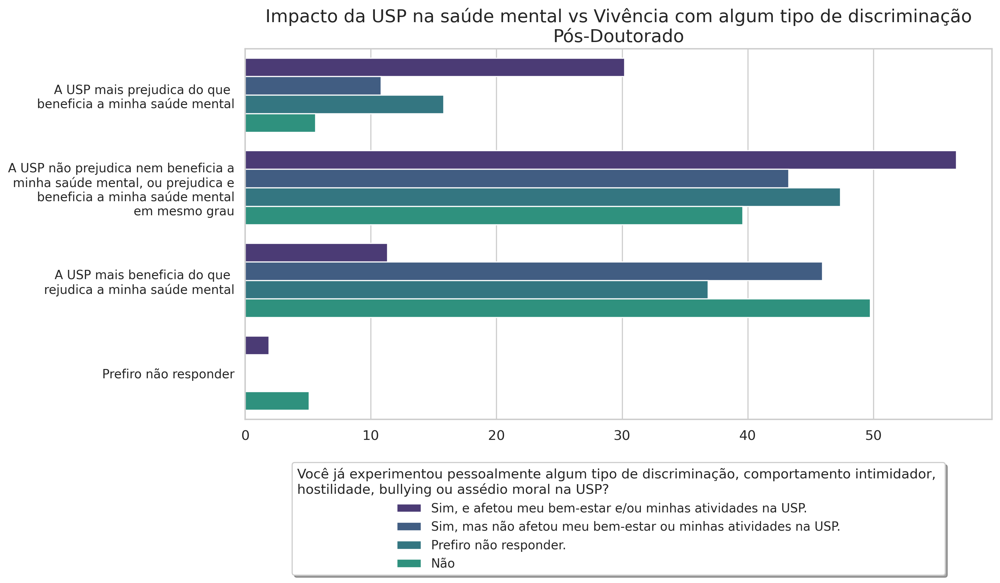

In [ ]:
# juntei

plt.figure(figsize = (12,6))
plt.rc('xtick', labelsize=12)

# Filtrar as respostas em branco
hostilidade_posdoc_filtrado = hostilidade_posdoc[hostilidade_posdoc['Respostas'] != 'Em branco']

ax = sns.barplot(data=hostilidade_posdoc_filtrado,
                 y='Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?',
                 x='Respostas',
                 hue='Você já experimentou pessoalmente algum tipo de discriminação, comportamento intimidador, hostilidade, bullying ou assédio moral na USP?',
                 order=['A USP mais prejudica do que beneficia a minha saúde mental',
                        'A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau',
                        'A USP mais beneficia do que prejudica a minha saúde mental', 'Prefiro não responder'])

plt.xlabel("")
plt.ylabel("")
plt.title("Impacto da USP na saúde mental vs Vivência com algum tipo de discriminação\nPós-Doutorado",size = 16)
ax.set_yticklabels(rotulos_quebrados)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, title = 'Você já experimentou pessoalmente algum tipo de discriminação, comportamento intimidador, \nhostilidade, bullying ou assédio moral na USP?', shadow=True, ncol=1)

plt.show()

#### Qui quadrado

In [ ]:
qui_quadrado(df_pos_doutorado, 'Você já experimentou pessoalmente algum tipo de discriminação, comportamento intimidador, hostilidade, bullying ou assédio moral na USP?', 'Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?')

,Qui2,p-Valor
"Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?",46.657446,0.000005


### Docentes

#### Tabela cruzada

In [ ]:
tabcruzada_hostilidade_docentes = pd.crosstab(df_docentes['Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?'], df_docentes['Você já experimentou pessoalmente algum tipo de discriminação, comportamento intimidador, hostilidade, bullying ou assédio moral na USP?']).reindex(index=row_order, columns=col_order)
tabcruzada_hostilidade_docentes

"Você já experimentou pessoalmente algum tipo de discriminação, comportamento intimidador, hostilidade, bullying ou assédio moral na USP?","Sim, e afetou meu bem-estar e/ou minhas atividades na USP.","Sim, mas não afetou meu bem-estar ou minhas atividades na USP.",Não,Prefiro não responder.
"Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?",,,,
A USP mais prejudica do que beneficia a minha saúde mental,140,37,71,9
"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",99,78,165,11
A USP mais beneficia do que prejudica a minha saúde mental,57,67,194,8
Prefiro não responder,16,14,32,2


#### Tabela percentual

In [ ]:
hostilidade_docentes = gera_tabela_percentual(df_docentes, 'Você já experimentou pessoalmente algum tipo de discriminação, comportamento intimidador, hostilidade, bullying ou assédio moral na USP?', percepcao_saudemental,ordem_respostas=ordem_legenda)
hostilidade_docentes

,index,"Você já experimentou pessoalmente algum tipo de discriminação, comportamento intimidador, hostilidade, bullying ou assédio moral na USP?","Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?",Respostas
0,2,"Sim, e afetou meu bem-estar e/ou minhas atividades na USP.",A USP mais prejudica do que beneficia a minha saúde mental,44.87%
1,3,"Sim, e afetou meu bem-estar e/ou minhas atividades na USP.","A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",31.73%
2,7,"Sim, e afetou meu bem-estar e/ou minhas atividades na USP.",A USP mais beneficia do que prejudica a minha saúde mental,18.27%
3,10,"Sim, e afetou meu bem-estar e/ou minhas atividades na USP.",Prefiro não responder,5.13%
4,4,"Sim, mas não afetou meu bem-estar ou minhas atividades na USP.","A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",39.80%
5,6,"Sim, mas não afetou meu bem-estar ou minhas atividades na USP.",A USP mais beneficia do que prejudica a minha saúde mental,34.18%
6,8,"Sim, mas não afetou meu bem-estar ou minhas atividades na USP.",A USP mais prejudica do que beneficia a minha saúde mental,18.88%
7,11,"Sim, mas não afetou meu bem-estar ou minhas atividades na USP.",Prefiro não responder,7.14%
8,12,Prefiro não responder.,"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",36.67%
9,13,Prefiro não responder.,A USP mais prejudica do que beneficia a minha saúde mental,30.00%


#### Visualização em gráfico de barras

In [ ]:
hostilidade_docentes = hostilidade_docentes.data

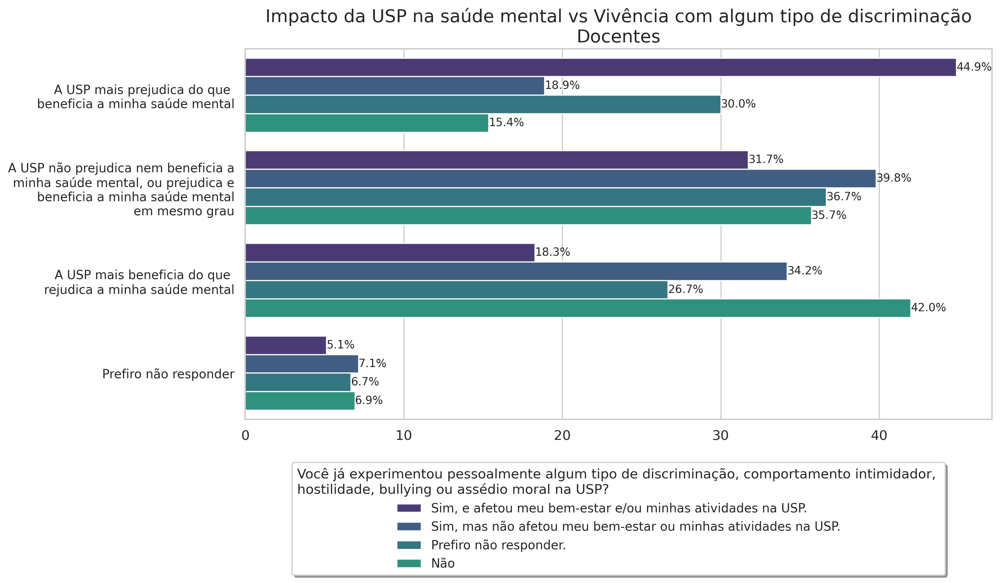

In [ ]:
plt.figure(figsize = (12,6))
plt.rc('xtick', labelsize=12)

ax = sns.barplot(data = hostilidade_docentes, y= 'Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?',\
                 x = 'Respostas', hue = 'Você já experimentou pessoalmente algum tipo de discriminação, comportamento intimidador, hostilidade, bullying ou assédio moral na USP?', order= ['A USP mais prejudica do que beneficia a minha saúde mental',
 'A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau',
 'A USP mais beneficia do que prejudica a minha saúde mental', 'Prefiro não responder'])
for p in ax.patches:
        porcentagem = '{:.1f}%'.format(p.get_width())
        x = p.get_x() + p.get_width()
        y = p.get_y() + p.get_height()/2 + 0.03
        ax.annotate(porcentagem, (x, y), fontsize = 10)

plt.xlabel("")
plt.ylabel("")
plt.title("Impacto da USP na saúde mental vs Vivência com algum tipo de discriminação\nDocentes",size = 16)
ax.set_yticklabels(rotulos_quebrados)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True,  title = 'Você já experimentou pessoalmente algum tipo de discriminação, comportamento intimidador, \nhostilidade, bullying ou assédio moral na USP?', shadow=True, ncol=1)

plt.show()

#### Qui quadrado

In [ ]:
qui_quadrado(df_docentes, 'Você já experimentou pessoalmente algum tipo de discriminação, comportamento intimidador, hostilidade, bullying ou assédio moral na USP?', 'Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?')

,Qui2,p-Valor
"Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?",103.654208,2.863009e-18


### Funcionários

In [ ]:
df_funcionarios['Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?'].unique()

array(['A USP mais beneficia do que prejudica a minha saúde mental',
       'A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau',
       'Prefiro não responder',
       'A USP mais prejudica do que beneficia a minha saúde mental'],
      dtype=object)

In [ ]:
tabcruzada_hostilidade_funcionarios = pd.crosstab(df_funcionarios['Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?'], df_funcionarios['Você já experimentou pessoalmente algum tipo de discriminação, comportamento intimidador, hostilidade, bullying ou assédio moral na USP?']).reindex(index=row_order, columns=col_order)
tabcruzada_hostilidade_funcionarios

"Você já experimentou pessoalmente algum tipo de discriminação, comportamento intimidador, hostilidade, bullying ou assédio moral na USP?","Sim, e afetou meu bem-estar e/ou minhas atividades na USP.","Sim, mas não afetou meu bem-estar ou minhas atividades na USP.",Não,Prefiro não responder.
"Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?",,,,
A USP mais prejudica do que beneficia a minha saúde mental,130,29,28,15
"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",112,75,128,37
A USP mais beneficia do que prejudica a minha saúde mental,71,86,153,20
Prefiro não responder,27,17,30,11


##### Tabela percentual

In [ ]:
hostilidade_funcionarios = gera_tabela_percentual(df_funcionarios, 'Você já experimentou pessoalmente algum tipo de discriminação, comportamento intimidador, hostilidade, bullying ou assédio moral na USP?', percepcao_saudemental, ordem_respostas=ordem_legenda)
hostilidade_funcionarios

,index,"Você já experimentou pessoalmente algum tipo de discriminação, comportamento intimidador, hostilidade, bullying ou assédio moral na USP?","Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?",Respostas
0,1,"Sim, e afetou meu bem-estar e/ou minhas atividades na USP.",A USP mais prejudica do que beneficia a minha saúde mental,38.24%
1,3,"Sim, e afetou meu bem-estar e/ou minhas atividades na USP.","A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",32.94%
2,6,"Sim, e afetou meu bem-estar e/ou minhas atividades na USP.",A USP mais beneficia do que prejudica a minha saúde mental,20.88%
3,11,"Sim, e afetou meu bem-estar e/ou minhas atividades na USP.",Prefiro não responder,7.94%
4,4,"Sim, mas não afetou meu bem-estar ou minhas atividades na USP.",A USP mais beneficia do que prejudica a minha saúde mental,41.55%
5,5,"Sim, mas não afetou meu bem-estar ou minhas atividades na USP.","A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",36.23%
6,9,"Sim, mas não afetou meu bem-estar ou minhas atividades na USP.",A USP mais prejudica do que beneficia a minha saúde mental,14.01%
7,13,"Sim, mas não afetou meu bem-estar ou minhas atividades na USP.",Prefiro não responder,8.21%
8,7,Prefiro não responder.,"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",44.58%
9,12,Prefiro não responder.,A USP mais beneficia do que prejudica a minha saúde mental,24.10%


#### Visualização em gráfico de barras

In [ ]:
hostilidade_funcionarios = hostilidade_funcionarios.data

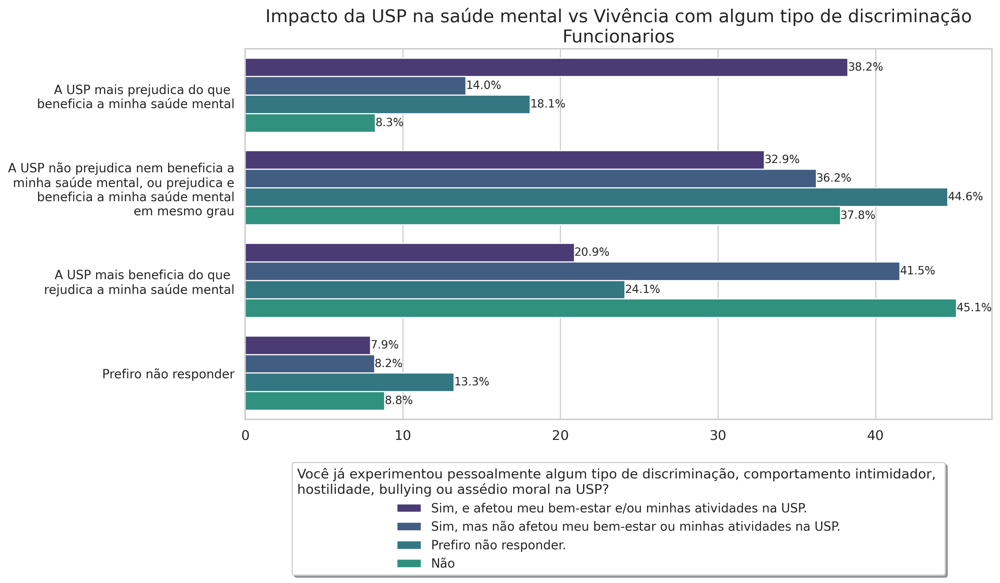

In [ ]:
plt.figure(figsize = (12,6))
plt.rc('xtick', labelsize=12)

ax = sns.barplot(data = hostilidade_funcionarios, y= 'Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?',\
                 x = 'Respostas', hue = 'Você já experimentou pessoalmente algum tipo de discriminação, comportamento intimidador, hostilidade, bullying ou assédio moral na USP?', order= ['A USP mais prejudica do que beneficia a minha saúde mental',
 'A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau',
 'A USP mais beneficia do que prejudica a minha saúde mental', 'Prefiro não responder'])
for p in ax.patches:
        porcentagem = '{:.1f}%'.format(p.get_width())
        x = p.get_x() + p.get_width()
        y = p.get_y() + p.get_height()/2 + 0.03
        ax.annotate(porcentagem, (x, y), fontsize = 10)

plt.xlabel("")
plt.ylabel("")
plt.title("Impacto da USP na saúde mental vs Vivência com algum tipo de discriminação\nFuncionarios",size = 16)
ax.set_yticklabels(rotulos_quebrados)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1),  title = 'Você já experimentou pessoalmente algum tipo de discriminação, comportamento intimidador, \nhostilidade, bullying ou assédio moral na USP?', fancybox=True, shadow=True, ncol=1)

plt.show()

#### Qui quadrado

In [ ]:
qui_quadrado(df_funcionarios, 'Você já experimentou pessoalmente algum tipo de discriminação, comportamento intimidador, hostilidade, bullying ou assédio moral na USP?', 'Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?')

,Qui2,p-Valor
"Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?",120.458654,1.076377e-21


---
## Questão 2
**Análise de quantas vezes ocorreu em cada posição institucional**

In [ ]:
q2_columns = ['Mais de dez vezes',
        'Entre cinco e dez vezes',
        'Entre duas e quatro vezes',
        'Uma única vez',
        'Prefiro não responder']

q2_row = ['A USP mais prejudica do que beneficia a minha saúde mental',
            'A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau',
            'A USP mais beneficia do que prejudica a minha saúde mental',
            'Prefiro não responder']


### Geral

##### Tabela cruzada

In [ ]:
df['Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?'].unique().tolist()

['Prefiro não responder',
 'Não se aplica',
 'Mais de dez vezes',
 'Entre duas e quatro vezes',
 'Entre cinco e dez vezes',
 'Uma única vez']

In [ ]:
df['Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?'].unique()

array(['A USP mais prejudica do que beneficia a minha saúde mental',
       'A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau',
       'A USP mais beneficia do que prejudica a minha saúde mental',
       'Prefiro não responder'], dtype=object)

In [ ]:
tabcruzada_recorrencia = pd.crosstab(df['Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?'],
df['Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?']).reindex(index=q2_row, columns=q2_columns )
tabcruzada_recorrencia

"Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?",Mais de dez vezes,Entre cinco e dez vezes,Entre duas e quatro vezes,Uma única vez,Prefiro não responder
"Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?",,,,,
A USP mais prejudica do que beneficia a minha saúde mental,306,196,426,129,220
"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",132,119,331,165,212
A USP mais beneficia do que prejudica a minha saúde mental,81,71,216,103,115
Prefiro não responder,17,14,16,12,50


##### Tabela percentual

In [ ]:
# tabela frequencia
recorrencia_geral = gera_tabela_percentual(df, 'Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?', percepcao_saudemental, ordem_respostas=q2_columns)
recorrencia_geral

,index,"Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?","Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?",Respostas
0,2,Mais de dez vezes,A USP mais prejudica do que beneficia a minha saúde mental,57.09%
1,16,Mais de dez vezes,Prefiro não responder,3.17%
3,13,Mais de dez vezes,A USP mais beneficia do que prejudica a minha saúde mental,15.11%
2,8,Mais de dez vezes,"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",24.63%
4,6,Entre cinco e dez vezes,A USP mais prejudica do que beneficia a minha saúde mental,49.00%
6,18,Entre cinco e dez vezes,Prefiro não responder,3.50%
5,14,Entre cinco e dez vezes,A USP mais beneficia do que prejudica a minha saúde mental,17.75%
7,10,Entre cinco e dez vezes,"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",29.75%
11,4,Entre duas e quatro vezes,A USP mais beneficia do que prejudica a minha saúde mental,21.84%
10,17,Entre duas e quatro vezes,Prefiro não responder,1.62%


##### Visualização em barras

In [ ]:
recorrencia_geral = recorrencia_geral.data

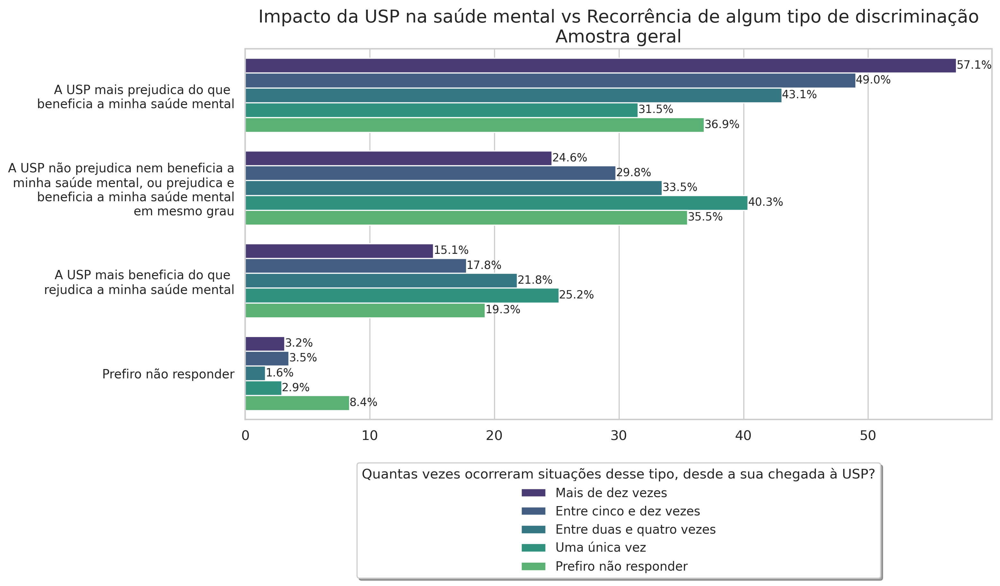

In [ ]:
# inclui o prefiro não responder
plt.figure(figsize = (12,6))
plt.rc('xtick', labelsize=12)

ax = sns.barplot(data = recorrencia_geral, y= 'Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?',\
                 x = 'Respostas', hue = 'Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?', order= ['A USP mais prejudica do que beneficia a minha saúde mental',
                'A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau',
                'A USP mais beneficia do que prejudica a minha saúde mental', 'Prefiro não responder'])
for p in ax.patches:
        porcentagem = '{:.1f}%'.format(p.get_width())
        x = p.get_x() + p.get_width()
        y = p.get_y() + p.get_height()/2 + 0.03
        ax.annotate(porcentagem, (x, y), fontsize=10)

plt.xlabel("")
plt.ylabel("")
plt.title("Impacto da USP na saúde mental vs Recorrência de algum tipo de discriminação\nAmostra geral",size = 16)
ax.set_yticklabels(rotulos_quebrados)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), title = 'Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?', fancybox=True, shadow=True, ncol=1)

plt.show()


##### Qui quadrado

In [ ]:
qui_quadrado(df,'Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?','Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?')

,Qui2,p-Valor
"Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?",462.757813,4.185131e-89


### Graduação

##### Tabela cruzada

In [ ]:
tabcruzada_recorrencia_grad = pd.crosstab(df_graduacao['Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?'], df_graduacao['Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?']).reindex(index=q2_row, columns=q2_columns)
tabcruzada_recorrencia_grad

"Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?",Mais de dez vezes,Entre cinco e dez vezes,Entre duas e quatro vezes,Uma única vez,Prefiro não responder
"Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?",,,,,
A USP mais prejudica do que beneficia a minha saúde mental,119,105,228,92,142
"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",34,39,111,58,56
A USP mais beneficia do que prejudica a minha saúde mental,7,17,62,23,23
Prefiro não responder,0,1,4,2,9


##### Tabela percentual

In [ ]:
recorrencia_grad = gera_tabela_percentual(df_graduacao, 'Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?', percepcao_saudemental,ordem_respostas=q2_columns )

recorrencia_grad

,index,"Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?","Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?",Respostas
1,2,Mais de dez vezes,A USP mais prejudica do que beneficia a minha saúde mental,74.38%
0,15,Mais de dez vezes,A USP mais beneficia do que prejudica a minha saúde mental,4.38%
2,10,Mais de dez vezes,"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",21.25%
3,9,Entre cinco e dez vezes,"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",24.07%
4,13,Entre cinco e dez vezes,A USP mais beneficia do que prejudica a minha saúde mental,10.49%
6,4,Entre cinco e dez vezes,A USP mais prejudica do que beneficia a minha saúde mental,64.81%
5,18,Entre cinco e dez vezes,Prefiro não responder,0.62%
10,0,Entre duas e quatro vezes,A USP mais prejudica do que beneficia a minha saúde mental,56.30%
8,3,Entre duas e quatro vezes,"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",27.41%
9,16,Entre duas e quatro vezes,Prefiro não responder,0.99%


##### Visualização em barras

In [ ]:
recorrencia_grad = recorrencia_grad.data

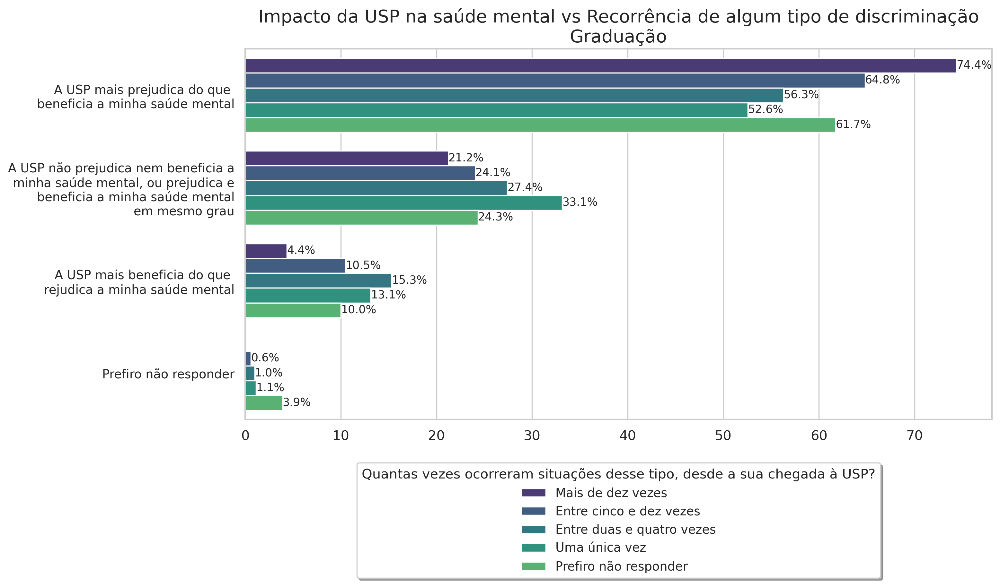

In [ ]:
# código com o prefiro não responder
plt.figure(figsize = (12,6))
plt.rc('xtick', labelsize=12)

ax = sns.barplot(data = recorrencia_grad, y= 'Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?',\
                 x = 'Respostas', hue = 'Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?', order= ['A USP mais prejudica do que beneficia a minha saúde mental',
                'A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau',
                'A USP mais beneficia do que prejudica a minha saúde mental', 'Prefiro não responder'])
for p in ax.patches:
        porcentagem = '{:.1f}%'.format(p.get_width())
        x = p.get_x() + p.get_width()
        y = p.get_y() + p.get_height()/2 + 0.03
        ax.annotate(porcentagem, (x, y), fontsize = 10)

plt.xlabel("")
plt.ylabel("")
plt.title("Impacto da USP na saúde mental vs Recorrência de algum tipo de discriminação\nGraduação",size = 16)
ax.set_yticklabels(rotulos_quebrados)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True,  title = 'Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?', shadow=True, ncol=1)

plt.show()


##### Qui quadrado

In [ ]:
qui_quadrado(df_graduacao,'Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?','Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?')

,Qui2,p-Valor
"Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?",249.078818,1.921604e-44


### Pós graduação

##### Tabela cruzada

In [ ]:
df_pos_graduacao['Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?'].unique().tolist()

['Entre duas e quatro vezes',
 'Prefiro não responder',
 'Não se aplica',
 'Mais de dez vezes',
 'Uma única vez',
 'Entre cinco e dez vezes']

In [ ]:
q2_columns2 = ['A USP mais prejudica do que beneficia a minha saúde mental',
 'A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau',
 'A USP mais beneficia do que prejudica a minha saúde mental',
 'Prefiro não responder.']

In [ ]:
df_pos_graduacao['Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?'].unique().tolist()

['A USP mais prejudica do que beneficia a minha saúde mental',
 'A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau',
 'A USP mais beneficia do que prejudica a minha saúde mental',
 'Prefiro não responder']

In [ ]:
df_pos_graduacao[df_pos_graduacao['Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?'] == 'Prefiro não responder'].count()

Unnamed: 0                                                               36
Curso de pós-graduação                                                   36
Ano de ingresso (Pós-Grad)                                               36
Unidade                                                                  36
Experiência acadêmica (Grad, Pós-Grad, Pós-Doc) (Escala Likert)          36
                                                                         ..
Acessibilidade (Apenas PCD) - Materiais instrucionais (Escala Likert)    36
Acessibilidade (Apenas PCD) - Sites (Escala Likert)                      36
Unidades padronizadas                                                    36
Campus                                                                   36
Posição institucional                                                    36
Length: 97, dtype: int64

In [ ]:
# tabela cruzada
tabcruzada_recorrencia_posgrad = pd.crosstab(df_pos_graduacao['Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?'],df_pos_graduacao['Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?']).reindex(index=q2_row, columns= q2_columns)
tabcruzada_recorrencia_posgrad

"Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?",Mais de dez vezes,Entre cinco e dez vezes,Entre duas e quatro vezes,Uma única vez,Prefiro não responder
"Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?",,,,,
A USP mais prejudica do que beneficia a minha saúde mental,56,32,72,15,25
"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",14,17,68,39,37
A USP mais beneficia do que prejudica a minha saúde mental,13,10,37,27,14
Prefiro não responder,1,0,0,2,2


##### Tabela percentual

In [ ]:
recorrencia_posgrad = gera_tabela_percentual(df_pos_graduacao, 'Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?', percepcao_saudemental, ordem_respostas=q2_columns)
recorrencia_posgrad

,index,"Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?","Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?",Respostas
1,2,Mais de dez vezes,A USP mais prejudica do que beneficia a minha saúde mental,66.67%
2,13,Mais de dez vezes,A USP mais beneficia do que prejudica a minha saúde mental,15.48%
3,12,Mais de dez vezes,"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",16.67%
0,17,Mais de dez vezes,Prefiro não responder,1.19%
4,14,Entre cinco e dez vezes,A USP mais beneficia do que prejudica a minha saúde mental,16.95%
6,6,Entre cinco e dez vezes,A USP mais prejudica do que beneficia a minha saúde mental,54.24%
5,9,Entre cinco e dez vezes,"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",28.81%
7,0,Entre duas e quatro vezes,A USP mais prejudica do que beneficia a minha saúde mental,40.68%
9,1,Entre duas e quatro vezes,"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",38.42%
8,5,Entre duas e quatro vezes,A USP mais beneficia do que prejudica a minha saúde mental,20.90%


##### Visualização em barras

In [ ]:
recorrencia_posgrad = recorrencia_posgrad.data

In [ ]:
df_pos_graduacao['Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?'].unique().tolist()

['Entre duas e quatro vezes',
 'Prefiro não responder',
 'Não se aplica',
 'Mais de dez vezes',
 'Uma única vez',
 'Entre cinco e dez vezes']

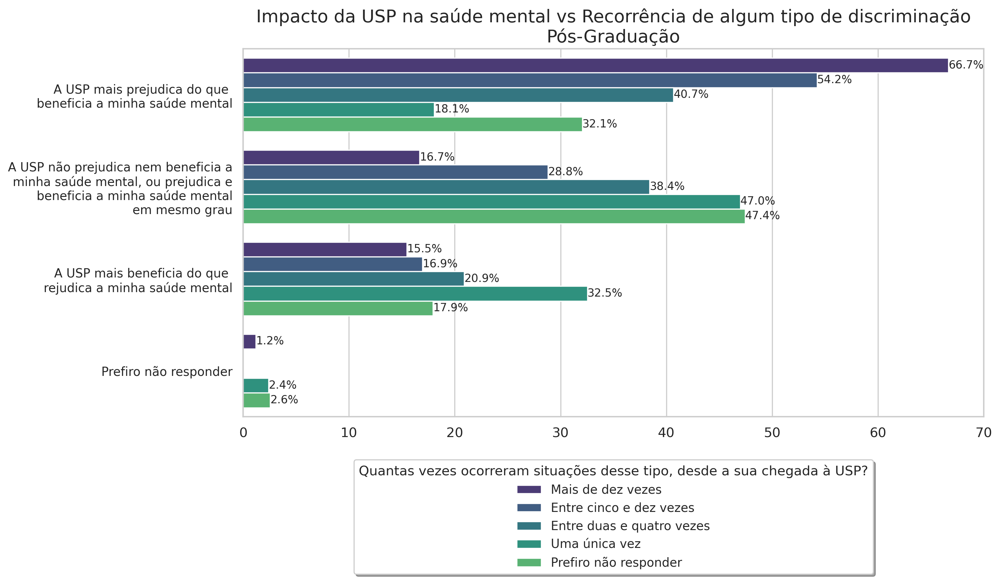

In [ ]:
# código com o prefiro não responder
plt.figure(figsize = (12,6))
plt.rc('xtick', labelsize=12)

ax = sns.barplot(data = recorrencia_posgrad, y= 'Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?',\
                 x = 'Respostas', hue = 'Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?', order= ['A USP mais prejudica do que beneficia a minha saúde mental',
                'A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau',
                'A USP mais beneficia do que prejudica a minha saúde mental', 'Prefiro não responder'])
for p in ax.patches:
        porcentagem = '{:.1f}%'.format(p.get_width())
        x = p.get_x() + p.get_width()
        y = p.get_y() + p.get_height()/2 + 0.03
        ax.annotate(porcentagem, (x, y), fontsize = 10)

plt.xlabel("")
plt.ylabel("")
plt.title("Impacto da USP na saúde mental vs Recorrência de algum tipo de discriminação\nPós-Graduação",size = 16)
ax.set_yticklabels(rotulos_quebrados)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, title = 'Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?', shadow=True, ncol=1)

plt.show()


##### Qui quadrado

In [ ]:
qui_quadrado(df_pos_graduacao,'Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?','Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?')

,Qui2,p-Valor
"Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?",201.019205,1.318784e-34


### Pós doutorado

##### Tabela cruzada

In [ ]:
df_pos_doutorado['Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?'].unique().tolist()

['A USP mais beneficia do que prejudica a minha saúde mental',
 'A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau',
 'A USP mais prejudica do que beneficia a minha saúde mental',
 'Prefiro não responder']

In [ ]:
# tabela cruzada
tabcruzada_recorrencia_posdoc = pd.crosstab(df_pos_doutorado['Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?'], df_pos_doutorado['Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?'] ).reindex(index=q2_row, columns= q2_columns)
tabcruzada_recorrencia_posdoc

"Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?",Mais de dez vezes,Entre cinco e dez vezes,Entre duas e quatro vezes,Uma única vez,Prefiro não responder
"Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?",,,,,
A USP mais prejudica do que beneficia a minha saúde mental,6,1,11,1,5
"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",7,7,26,6,13
A USP mais beneficia do que prejudica a minha saúde mental,2,2,11,5,11
Prefiro não responder,0,0,0,1,0


##### Tabela percentual

In [ ]:
recorrencia_posdoc = gera_tabela_percentual(df_pos_doutorado, 'Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?', percepcao_saudemental, ordem_respostas=q2_columns)
recorrencia_posdoc

,index,"Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?","Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?",Respostas
0,5,Mais de dez vezes,"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",46.67%
1,7,Mais de dez vezes,A USP mais prejudica do que beneficia a minha saúde mental,40.00%
2,11,Mais de dez vezes,A USP mais beneficia do que prejudica a minha saúde mental,13.33%
3,6,Entre cinco e dez vezes,"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",70.00%
4,12,Entre cinco e dez vezes,A USP mais beneficia do que prejudica a minha saúde mental,20.00%
5,13,Entre cinco e dez vezes,A USP mais prejudica do que beneficia a minha saúde mental,10.00%
6,0,Entre duas e quatro vezes,"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",54.17%
7,2,Entre duas e quatro vezes,A USP mais beneficia do que prejudica a minha saúde mental,22.92%
8,3,Entre duas e quatro vezes,A USP mais prejudica do que beneficia a minha saúde mental,22.92%
9,8,Uma única vez,"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",46.15%


##### Visualização em barras

In [ ]:
recorrencia_posdoc = recorrencia_posdoc.data

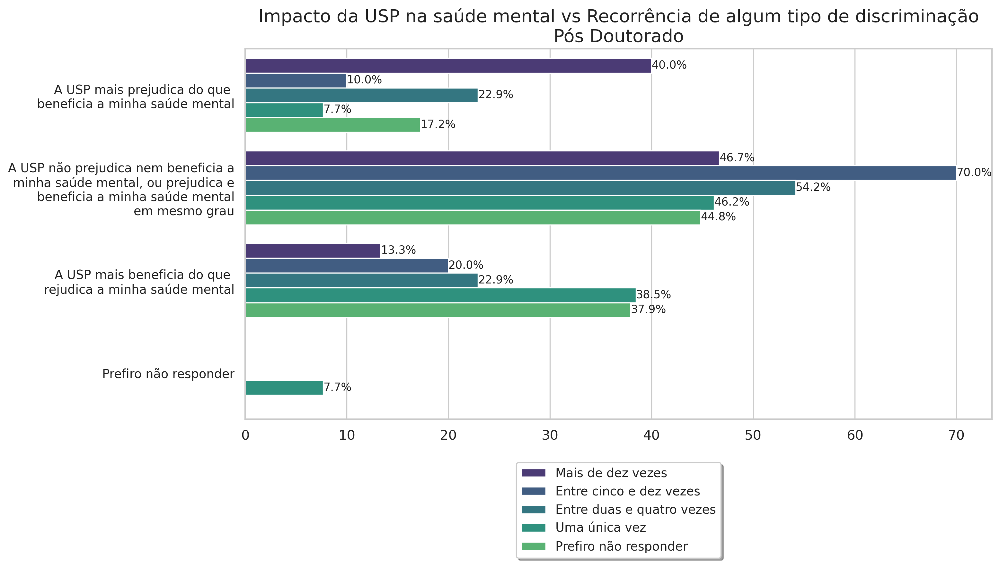

In [ ]:
# inclui o "prefiro não responder"
plt.figure(figsize = (12,6))
plt.rc('xtick', labelsize=12)

ax = sns.barplot(data = recorrencia_posdoc, y= 'Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?',\
                 x = 'Respostas', hue = 'Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?', order= ['A USP mais prejudica do que beneficia a minha saúde mental',
                'A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau',
                'A USP mais beneficia do que prejudica a minha saúde mental', 'Prefiro não responder'])
for p in ax.patches:
        porcentagem = '{:.1f}%'.format(p.get_width())
        x = p.get_x() + p.get_width()
        y = p.get_y() + p.get_height()/2 + 0.03
        ax.annotate(porcentagem, (x, y), fontsize=10)

plt.xlabel("")
plt.ylabel("")
plt.title("Impacto da USP na saúde mental vs Recorrência de algum tipo de discriminação\nPós Doutorado",size = 16)
ax.set_yticklabels(rotulos_quebrados)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=1)

plt.show()


##### Qui quadrado

In [ ]:
qui_quadrado(df_pos_doutorado,'Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?','Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?')

,Qui2,p-Valor
"Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?",44.126731,0.000105


### Docentes

##### Tabela cruzada

In [ ]:
tabcruzada_recorrencia_docentes = pd.crosstab(df_docentes['Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?'], df_docentes['Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?'] ).reindex(index=q2_row, columns= q2_columns)
tabcruzada_recorrencia_docentes

"Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?",Mais de dez vezes,Entre cinco e dez vezes,Entre duas e quatro vezes,Uma única vez,Prefiro não responder
"Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?",,,,,
A USP mais prejudica do que beneficia a minha saúde mental,58,37,64,15,17
"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",38,28,74,22,35
A USP mais beneficia do que prejudica a minha saúde mental,30,12,55,20,21
Prefiro não responder,6,5,6,2,13


##### Tabela percentual

In [ ]:
recorrencia_docentes = gera_tabela_percentual(df_docentes, 'Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?', percepcao_saudemental)
recorrencia_docentes

,index,"Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?","Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?",Respostas
0,8,Entre cinco e dez vezes,A USP mais prejudica do que beneficia a minha saúde mental,45.12%
3,22,Entre cinco e dez vezes,Prefiro não responder,6.10%
1,19,Entre cinco e dez vezes,A USP mais beneficia do que prejudica a minha saúde mental,14.63%
2,12,Entre cinco e dez vezes,"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",34.15%
6,4,Entre duas e quatro vezes,A USP mais prejudica do que beneficia a minha saúde mental,32.16%
7,6,Entre duas e quatro vezes,A USP mais beneficia do que prejudica a minha saúde mental,27.64%
4,21,Entre duas e quatro vezes,Prefiro não responder,3.02%
5,2,Entre duas e quatro vezes,"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",37.19%
9,20,Mais de dez vezes,Prefiro não responder,4.55%
10,5,Mais de dez vezes,A USP mais prejudica do que beneficia a minha saúde mental,43.94%


##### Visualização em barras

In [ ]:
recorrencia_docentes = recorrencia_docentes.data

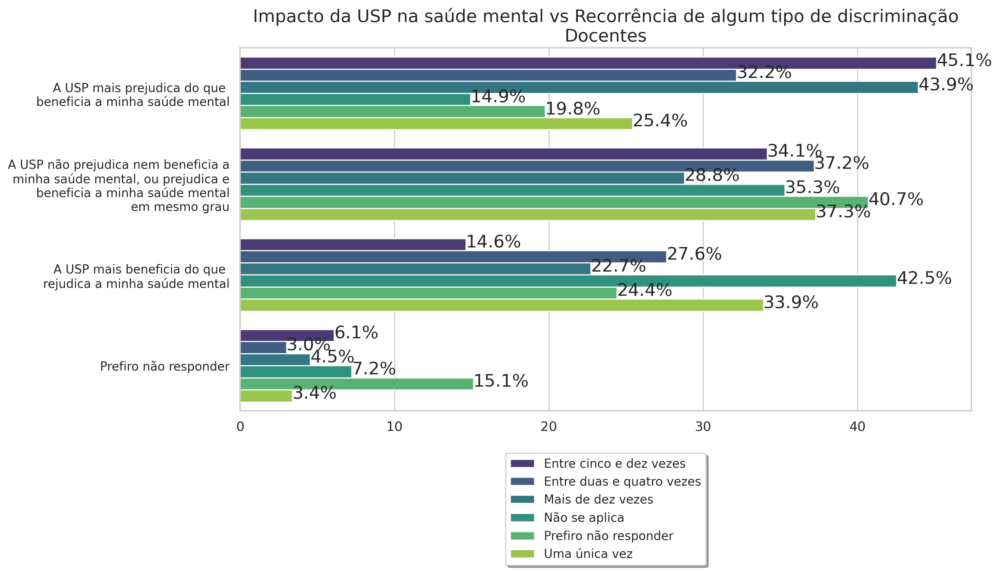

In [ ]:
# inclui o "prefiro não responder"
plt.figure(figsize = (12,6))
plt.rc('xtick', labelsize=12)

ax = sns.barplot(data = recorrencia_docentes, y= 'Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?',\
                 x = 'Respostas', hue = 'Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?', order= ['A USP mais prejudica do que beneficia a minha saúde mental',
                'A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau',
                'A USP mais beneficia do que prejudica a minha saúde mental', 'Prefiro não responder'])
for p in ax.patches:
        porcentagem = '{:.1f}%'.format(p.get_width())
        x = p.get_x() + p.get_width()
        y = p.get_y() + p.get_height()/2 + 0.03
        ax.annotate(porcentagem, (x, y))

plt.xlabel("")
plt.ylabel("")
plt.title("Impacto da USP na saúde mental vs Recorrência de algum tipo de discriminação\nDocentes",size = 16)
ax.set_yticklabels(rotulos_quebrados)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=1)

plt.show()


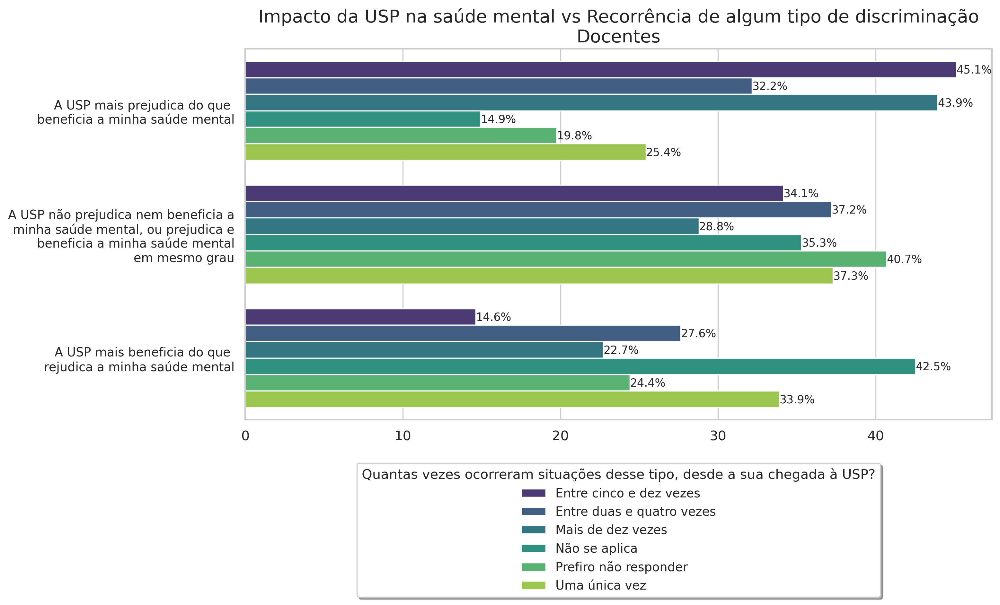

In [ ]:
# Filtrando para eliminar o "Prefiro não responder"
recorrencia_docentes_filtrado = recorrencia_docentes[recorrencia_docentes['Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?'] != 'Prefiro não responder']

# Criando o gráfico de barras
plt.figure(figsize=(12, 6))
plt.rc('xtick', labelsize=12)

ax = sns.barplot(
    data=recorrencia_docentes_filtrado,
    y='Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?',
    x='Respostas',
    hue='Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?',
    order=[
        'A USP mais prejudica do que beneficia a minha saúde mental',
        'A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau',
        'A USP mais beneficia do que prejudica a minha saúde mental'
    ]
)

for p in ax.patches:
    porcentagem = '{:.1f}%'.format(p.get_width())
    x = p.get_x() + p.get_width()
    y = p.get_y() + p.get_height() / 2 + 0.03
    ax.annotate(porcentagem, (x, y), fontsize=10)

plt.xlabel("")
plt.ylabel("")
plt.title("Impacto da USP na saúde mental vs Recorrência de algum tipo de discriminação\nDocentes",size = 16)
ax.set_yticklabels(rotulos_quebrados2)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True,  title = 'Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?', shadow=True, ncol=1)
plt.show()



##### Qui quadrado

In [ ]:
qui_quadrado(df_docentes,'Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?','Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?')


,Qui2,p-Valor
"Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?",100.627638,9.919727e-15


### Funcionários

##### Tabela cruzada

In [ ]:
tabcruzada_recorrencia_funcionarios = pd.crosstab(df_funcionarios['Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?'], df_funcionarios['Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?']).reindex(index=q2_row, columns= q2_columns)
tabcruzada_recorrencia_funcionarios

"Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?",Mais de dez vezes,Entre cinco e dez vezes,Entre duas e quatro vezes,Uma única vez,Prefiro não responder
"Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?",,,,,
A USP mais prejudica do que beneficia a minha saúde mental,67,22,52,6,29
"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",40,28,53,42,67
A USP mais beneficia do que prejudica a minha saúde mental,29,30,51,29,45
Prefiro não responder,10,8,6,5,26


##### Tabela percentual

In [ ]:
recorrencia_funcionarios = gera_tabela_percentual(df_funcionarios, 'Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?', percepcao_saudemental)
recorrencia_funcionarios

,index,"Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?","Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?",Respostas
1,20,Entre cinco e dez vezes,Prefiro não responder,9.09%
2,18,Entre cinco e dez vezes,A USP mais prejudica do que beneficia a minha saúde mental,25.00%
0,11,Entre cinco e dez vezes,A USP mais beneficia do que prejudica a minha saúde mental,34.09%
3,15,Entre cinco e dez vezes,"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",31.82%
4,21,Entre duas e quatro vezes,Prefiro não responder,3.70%
7,6,Entre duas e quatro vezes,A USP mais beneficia do que prejudica a minha saúde mental,31.48%
5,4,Entre duas e quatro vezes,"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",32.72%
6,5,Entre duas e quatro vezes,A USP mais prejudica do que beneficia a minha saúde mental,32.10%
9,19,Mais de dez vezes,Prefiro não responder,6.85%
11,12,Mais de dez vezes,A USP mais beneficia do que prejudica a minha saúde mental,19.86%


##### Visualização em barras

In [ ]:
recorrencia_funcionarios = recorrencia_funcionarios.data

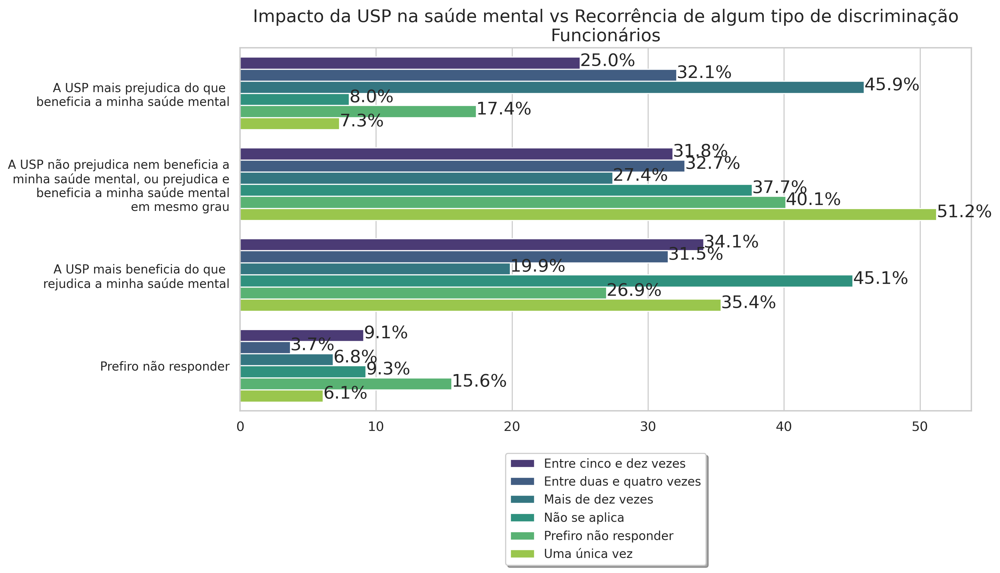

In [ ]:
# inclui o prefiro não responder
plt.figure(figsize = (12,6))
plt.rc('xtick', labelsize=12)

ax = sns.barplot(data = recorrencia_funcionarios, y= 'Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?',\
                 x = 'Respostas', hue = 'Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?', order= ['A USP mais prejudica do que beneficia a minha saúde mental',
                'A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau',
                'A USP mais beneficia do que prejudica a minha saúde mental', 'Prefiro não responder'])
for p in ax.patches:
        porcentagem = '{:.1f}%'.format(p.get_width())
        x = p.get_x() + p.get_width()
        y = p.get_y() + p.get_height()/2 + 0.03
        ax.annotate(porcentagem, (x, y))

plt.xlabel("")
plt.ylabel("")
plt.title("Impacto da USP na saúde mental vs Recorrência de algum tipo de discriminação\nFuncionários",size = 16)
ax.set_yticklabels(rotulos_quebrados)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=1)

plt.show()


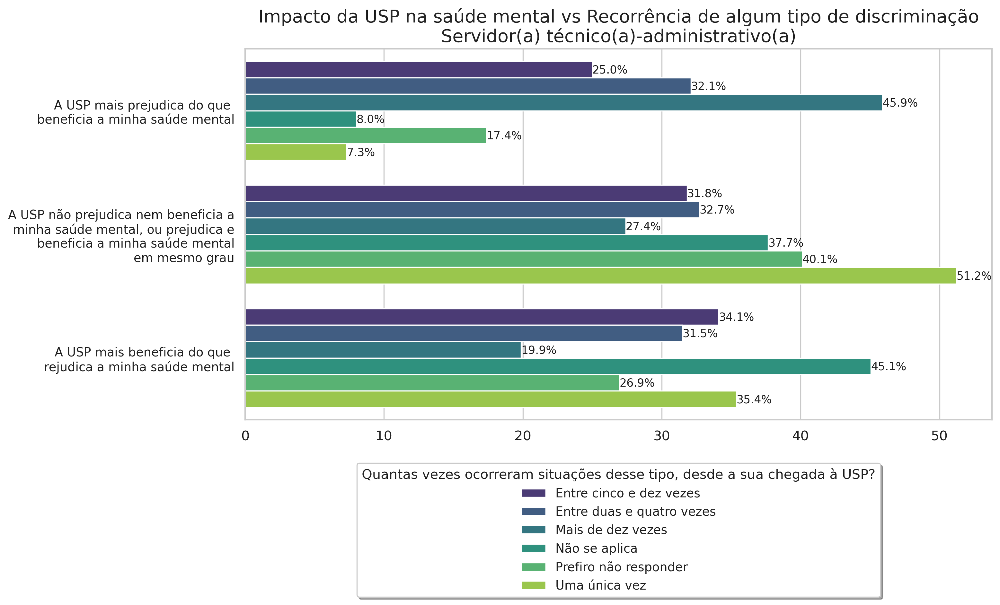

In [ ]:
# Filtrando para eliminar o "Prefiro não responder"
recorrencia_func_filtrado = recorrencia_funcionarios[recorrencia_funcionarios['Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?'] != 'Prefiro não responder']

# Criando o gráfico de barras
plt.figure(figsize=(12, 6))
plt.rc('xtick', labelsize=12)

ax = sns.barplot(
    data=recorrencia_func_filtrado,
    y='Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?',
    x='Respostas',
    hue='Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?',
    order=[
        'A USP mais prejudica do que beneficia a minha saúde mental',
        'A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau',
        'A USP mais beneficia do que prejudica a minha saúde mental'
    ]
)

for p in ax.patches:
    porcentagem = '{:.1f}%'.format(p.get_width())
    x = p.get_x() + p.get_width()
    y = p.get_y() + p.get_height() / 2 + 0.03
    ax.annotate(porcentagem, (x, y), fontsize=10)

plt.xlabel("")
plt.ylabel("")
plt.title("Impacto da USP na saúde mental vs Recorrência de algum tipo de discriminação\nServidor(a) técnico(a)-administrativo(a)",size = 16)
ax.set_yticklabels(rotulos_quebrados2)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True,  title = 'Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?', shadow=True, ncol=1)
plt.show()



##### Qui quadrado

In [ ]:
qui_quadrado(df_funcionarios,'Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?','Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?')

,Qui2,p-Valor
"Quantas vezes ocorreram situações desse tipo, desde a sua chegada à USP?",136.236736,1.269082e-21


---
## Questão 3
**A partir da sua experiência dentro do campus da USP, como você sente os ambientes institucionais, na maior parte do tempo?**

In [ ]:
escala = ['Muito desconfortável',
          'Desconfortável',
          'Nem confortável nem desconfortável',
          #'Não sei/ Não se aplica',
          'Confortável',
          'Muito confortável']

In [ ]:
q3_col_order = ['1 Hostil','2', '3', '4', '5 Amigável']

q2_row

['A USP mais prejudica do que beneficia a minha saúde mental',
 'A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau',
 'A USP mais beneficia do que prejudica a minha saúde mental',
 'Prefiro não responder']

### Geral

#### Tabela cruzada

In [ ]:
percepcao_saudemental

'Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?'

In [ ]:
tabcruzada_ambiente_geral = pd.crosstab(df['Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?'], df['A partir da sua experiência dentro do campus da USP, como você sente os ambientes institucionais, na maior parte do tempo?']).reindex(index=q2_row, columns=q3_col_order)
tabcruzada_ambiente_geral

"A partir da sua experiência dentro do campus da USP, como você sente os ambientes institucionais, na maior parte do tempo?",1 Hostil,2,3,4,5 Amigável
"Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?",,,,,
A USP mais prejudica do que beneficia a minha saúde mental,163,457,695,585,221
"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",22,138,587,1078,612
A USP mais beneficia do que prejudica a minha saúde mental,16,63,226,654,799
Prefiro não responder,5,17,59,105,68


#### Tabela percentual

In [ ]:
ambientes_geral = gera_tabela_percentual(df, 'A partir da sua experiência dentro do campus da USP, como você sente os ambientes institucionais, na maior parte do tempo?', 'Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?')
ambientes_geral

,index,"A partir da sua experiência dentro do campus da USP, como você sente os ambientes institucionais, na maior parte do tempo?","Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?",Respostas
3,10,1 Hostil,A USP mais prejudica do que beneficia a minha saúde mental,79.13%
2,18,1 Hostil,A USP mais beneficia do que prejudica a minha saúde mental,7.77%
1,16,1 Hostil,"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",10.68%
0,19,1 Hostil,Prefiro não responder,2.43%
4,17,2,Prefiro não responder,2.52%
5,14,2,A USP mais beneficia do que prejudica a minha saúde mental,9.33%
6,7,2,A USP mais prejudica do que beneficia a minha saúde mental,67.70%
7,11,2,"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",20.44%
8,2,3,A USP mais prejudica do que beneficia a minha saúde mental,44.35%
10,5,3,"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",37.46%


#### Visualização em gráfico de barras

In [ ]:
ambientes_geral = ambientes_geral.data

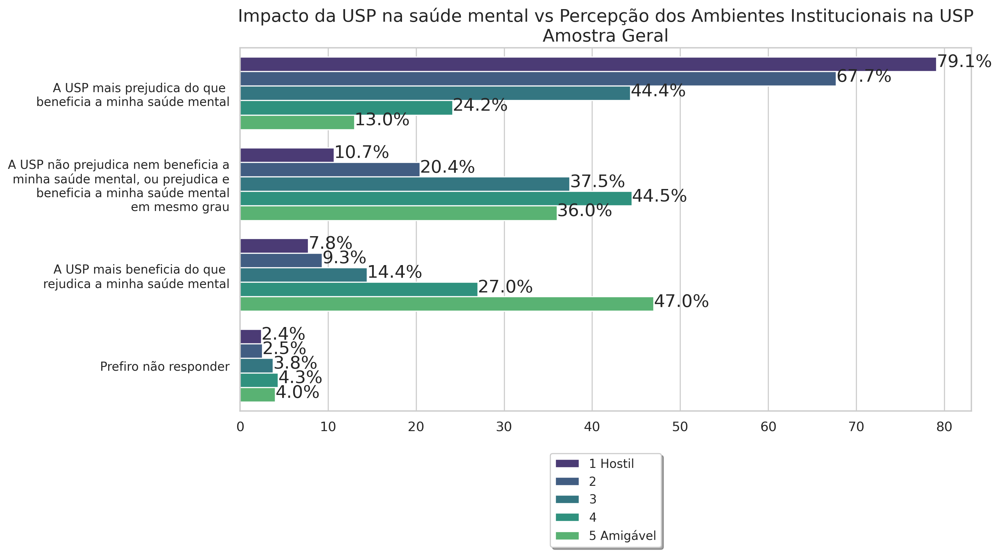

In [ ]:
plt.figure(figsize = (12,6))
plt.rc('xtick', labelsize=12)

ax = sns.barplot(data = ambientes_geral, y= 'Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?',\
                 x = 'Respostas', hue = 'A partir da sua experiência dentro do campus da USP, como você sente os ambientes institucionais, na maior parte do tempo?', order= ['A USP mais prejudica do que beneficia a minha saúde mental',
 'A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau',
 'A USP mais beneficia do que prejudica a minha saúde mental', 'Prefiro não responder'])
for p in ax.patches:
        porcentagem = '{:.1f}%'.format(p.get_width())
        x = p.get_x() + p.get_width()
        y = p.get_y() + p.get_height()/2 + 0.03
        ax.annotate(porcentagem, (x, y))

plt.xlabel("")
plt.ylabel("")
plt.title("Impacto da USP na saúde mental vs Percepção dos Ambientes Institucionais na USP\nAmostra Geral",size = 16)
ax.set_yticklabels(rotulos_quebrados)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=1)

plt.show()

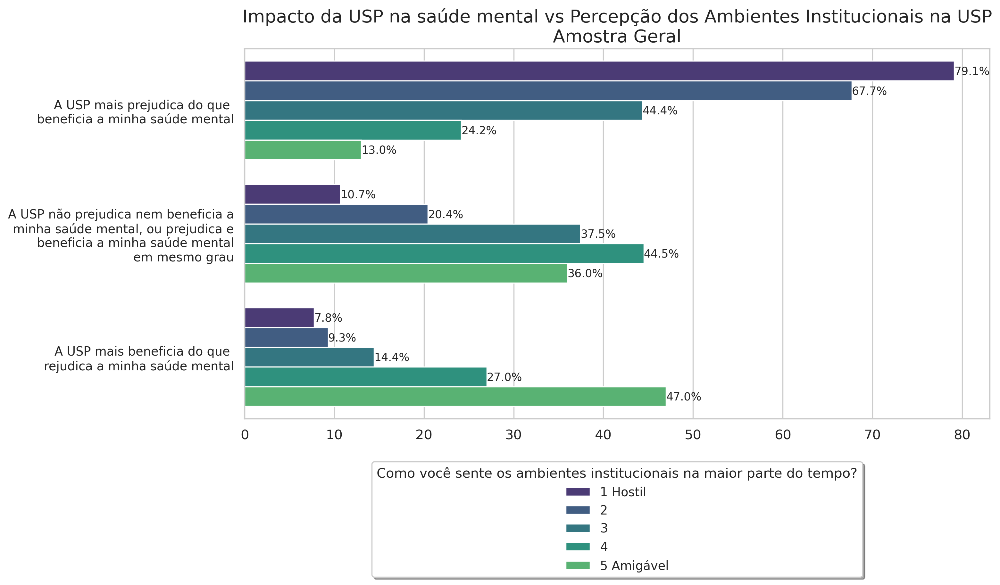

In [ ]:
# Filtrando as respostas "Prefiro não responder"
ambientes_geral_filtrado = ambientes_geral[ambientes_geral['Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?'] != 'Prefiro não responder']

plt.figure(figsize=(12, 6))
plt.rc('xtick', labelsize=12)

ax = sns.barplot(
    data=ambientes_geral_filtrado,
    y='Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?',
    x='Respostas',
    hue='A partir da sua experiência dentro do campus da USP, como você sente os ambientes institucionais, na maior parte do tempo?',
    order=[
        'A USP mais prejudica do que beneficia a minha saúde mental',
        'A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau',
        'A USP mais beneficia do que prejudica a minha saúde mental'
    ]
)

for p in ax.patches:
    porcentagem = '{:.1f}%'.format(p.get_width())
    x = p.get_x() + p.get_width()
    y = p.get_y() + p.get_height() / 2 + 0.03
    ax.annotate(porcentagem, (x, y), fontsize = 10)

plt.xlabel("")
plt.ylabel("")
plt.title("Impacto da USP na saúde mental vs Percepção dos Ambientes Institucionais na USP\nAmostra Geral", size=16)
ax.set_yticklabels(rotulos_quebrados2)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, title = 'Como você sente os ambientes institucionais na maior parte do tempo?' ,shadow=True, ncol=1)

plt.show()


#### Qui quadrado

In [ ]:
qui_quadrado(df, 'Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?', 'A partir da sua experiência dentro do campus da USP, como você sente os ambientes institucionais, na maior parte do tempo?')

,Qui2,p-Valor
"A partir da sua experiência dentro do campus da USP, como você sente os ambientes institucionais, na maior parte do tempo?",1303.745758,7.765651e-272


### Graduação

#### Tabela cruzada

In [ ]:
tabcruzada_ambiente_grad = pd.crosstab(df_graduacao['Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?'], df_graduacao['A partir da sua experiência dentro do campus da USP, como você sente os ambientes institucionais, na maior parte do tempo?']).reindex(index=q2_row, columns=q3_col_order)
tabcruzada_ambiente_grad


"A partir da sua experiência dentro do campus da USP, como você sente os ambientes institucionais, na maior parte do tempo?",1 Hostil,2,3,4,5 Amigável
"Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?",,,,,
A USP mais prejudica do que beneficia a minha saúde mental,106,250,422,380,151
"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",12,62,254,478,283
A USP mais beneficia do que prejudica a minha saúde mental,3,21,80,210,231
Prefiro não responder,1,8,19,25,5


#### Tabela percentual

In [ ]:
ambientes_grad = gera_tabela_percentual(df_graduacao,'A partir da sua experiência dentro do campus da USP, como você sente os ambientes institucionais, na maior parte do tempo?', 'Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?')
ambientes_grad

,index,"A partir da sua experiência dentro do campus da USP, como você sente os ambientes institucionais, na maior parte do tempo?","Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?",Respostas
0,9,1 Hostil,A USP mais prejudica do que beneficia a minha saúde mental,86.89%
2,18,1 Hostil,A USP mais beneficia do que prejudica a minha saúde mental,2.46%
3,19,1 Hostil,Prefiro não responder,0.82%
1,15,1 Hostil,"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",9.84%
4,5,2,A USP mais prejudica do que beneficia a minha saúde mental,73.31%
7,16,2,Prefiro não responder,2.35%
6,13,2,A USP mais beneficia do que prejudica a minha saúde mental,6.16%
5,11,2,"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",18.18%
11,1,3,A USP mais prejudica do que beneficia a minha saúde mental,54.45%
10,14,3,Prefiro não responder,2.45%


#### Visualização em gráfico de barras

In [ ]:
ambientes_grad = ambientes_grad.data

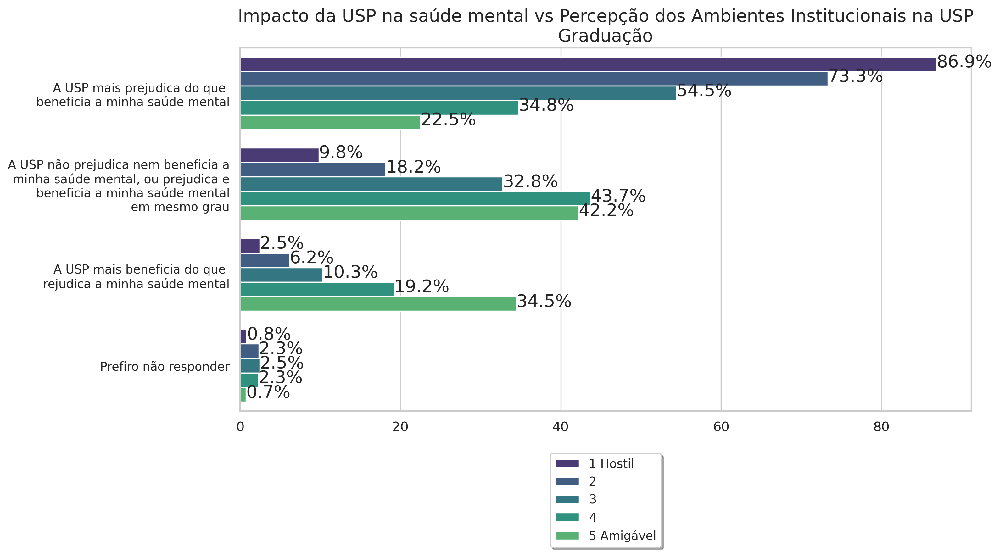

In [ ]:
plt.figure(figsize = (12,6))
plt.rc('xtick', labelsize=12)

ax = sns.barplot(data = ambientes_grad, y= 'Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?',\
                 x = 'Respostas', hue = 'A partir da sua experiência dentro do campus da USP, como você sente os ambientes institucionais, na maior parte do tempo?', order= ['A USP mais prejudica do que beneficia a minha saúde mental',
 'A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau',
 'A USP mais beneficia do que prejudica a minha saúde mental', 'Prefiro não responder'])
for p in ax.patches:
        porcentagem = '{:.1f}%'.format(p.get_width())
        x = p.get_x() + p.get_width()
        y = p.get_y() + p.get_height()/2 + 0.03
        ax.annotate(porcentagem, (x, y))

plt.xlabel("")
plt.ylabel("")
plt.title("Impacto da USP na saúde mental vs Percepção dos Ambientes Institucionais na USP\nGraduação",size = 16)
ax.set_yticklabels(rotulos_quebrados)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=1)

plt.show()

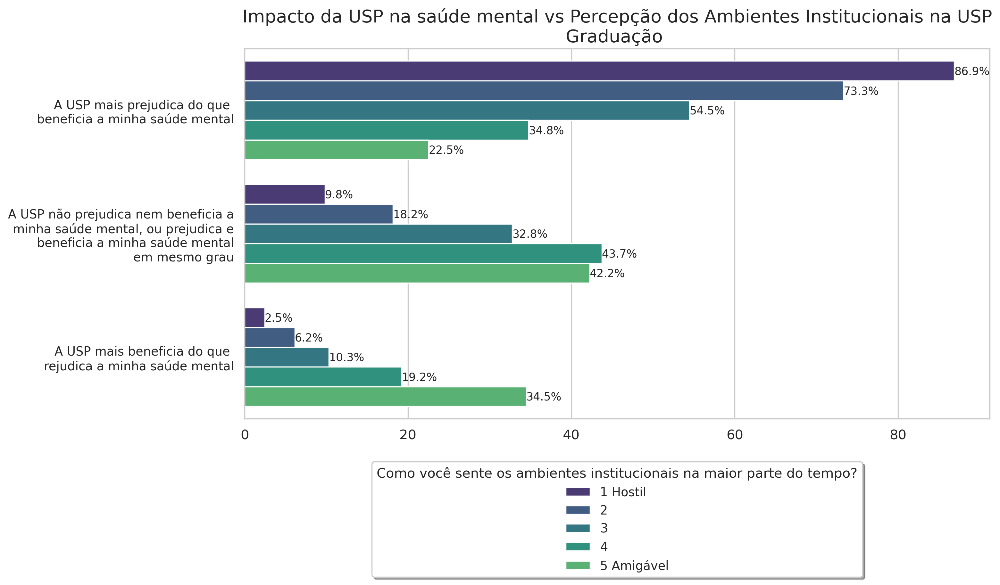

In [ ]:
# Filtrando as respostas "Prefiro não responder"
ambientes_grad_filtrado = ambientes_grad[ambientes_grad['Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?'] != 'Prefiro não responder']

plt.figure(figsize=(12, 6))
plt.rc('xtick', labelsize=12)

ax = sns.barplot(
    data=ambientes_grad_filtrado,
    y='Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?',
    x='Respostas',
    hue='A partir da sua experiência dentro do campus da USP, como você sente os ambientes institucionais, na maior parte do tempo?',
    order=[
        'A USP mais prejudica do que beneficia a minha saúde mental',
        'A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau',
        'A USP mais beneficia do que prejudica a minha saúde mental'
    ]
)

for p in ax.patches:
    porcentagem = '{:.1f}%'.format(p.get_width())
    x = p.get_x() + p.get_width()
    y = p.get_y() + p.get_height() / 2 + 0.03
    ax.annotate(porcentagem, (x, y), fontsize = 10)

plt.xlabel("")
plt.ylabel("")
plt.title("Impacto da USP na saúde mental vs Percepção dos Ambientes Institucionais na USP\nGraduação ", size=16)
ax.set_yticklabels(rotulos_quebrados2)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, title = 'Como você sente os ambientes institucionais na maior parte do tempo?',shadow=True, ncol=1)

plt.show()


#### Qui quadrado

In [ ]:
qui_quadrado(df_graduacao, 'Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?', 'A partir da sua experiência dentro do campus da USP, como você sente os ambientes institucionais, na maior parte do tempo?')

,Qui2,p-Valor
"A partir da sua experiência dentro do campus da USP, como você sente os ambientes institucionais, na maior parte do tempo?",486.721323,1.482027e-96


### Pós graduação

#### Tabela cruzada

In [ ]:
tabcruzada_ambiente_posgrad = pd.crosstab(df_pos_graduacao['Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?'],df_pos_graduacao['A partir da sua experiência dentro do campus da USP, como você sente os ambientes institucionais, na maior parte do tempo?']).reindex(index=q2_row, columns=q3_col_order)
tabcruzada_ambiente_posgrad

"A partir da sua experiência dentro do campus da USP, como você sente os ambientes institucionais, na maior parte do tempo?",1 Hostil,2,3,4,5 Amigável
"Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?",,,,,
A USP mais prejudica do que beneficia a minha saúde mental,27,84,97,73,37
"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",2,29,127,206,142
A USP mais beneficia do que prejudica a minha saúde mental,4,11,59,149,205
Prefiro não responder,1,2,4,13,16


#### Tabela percentual

In [ ]:
ambientes_posgrad = gera_tabela_percentual(df_pos_graduacao,'A partir da sua experiência dentro do campus da USP, como você sente os ambientes institucionais, na maior parte do tempo?', percepcao_saudemental)
ambientes_posgrad

,index,"A partir da sua experiência dentro do campus da USP, como você sente os ambientes institucionais, na maior parte do tempo?","Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?",Respostas
3,11,1 Hostil,A USP mais prejudica do que beneficia a minha saúde mental,79.41%
0,19,1 Hostil,Prefiro não responder,2.94%
2,18,1 Hostil,"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",5.88%
1,16,1 Hostil,A USP mais beneficia do que prejudica a minha saúde mental,11.76%
5,6,2,A USP mais prejudica do que beneficia a minha saúde mental,66.67%
6,14,2,A USP mais beneficia do que prejudica a minha saúde mental,8.73%
4,17,2,Prefiro não responder,1.59%
7,10,2,"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",23.02%
11,8,3,A USP mais beneficia do que prejudica a minha saúde mental,20.56%
10,5,3,A USP mais prejudica do que beneficia a minha saúde mental,33.80%


In [ ]:
ambientes_posgrad = ambientes_posgrad.data

#### Visualização

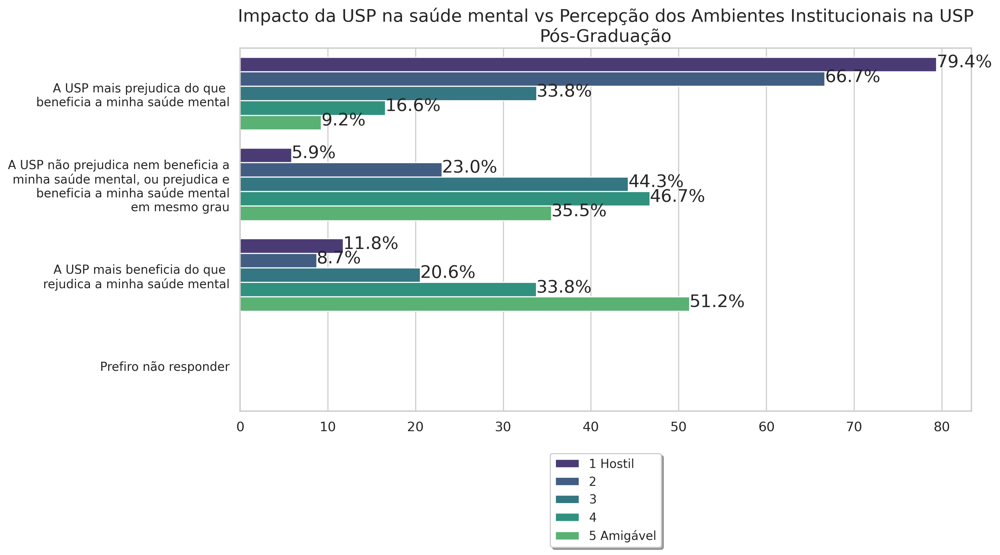

In [ ]:
plt.figure(figsize = (12,6))
plt.rc('xtick', labelsize=12)

ax = sns.barplot(data = ambientes_posgrad, y= 'Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?',\
                 x = 'Respostas', hue = 'A partir da sua experiência dentro do campus da USP, como você sente os ambientes institucionais, na maior parte do tempo?', order= ['A USP mais prejudica do que beneficia a minha saúde mental',
 'A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau',
 'A USP mais beneficia do que prejudica a minha saúde mental', 'Em branco'])
for p in ax.patches:
        porcentagem = '{:.1f}%'.format(p.get_width())
        x = p.get_x() + p.get_width()
        y = p.get_y() + p.get_height()/2 + 0.03
        ax.annotate(porcentagem, (x, y))

plt.xlabel("")
plt.ylabel("")
plt.title("Impacto da USP na saúde mental vs Percepção dos Ambientes Institucionais na USP\nPós-Graduação",size = 16)
ax.set_yticklabels(rotulos_quebrados)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=1)

plt.show()

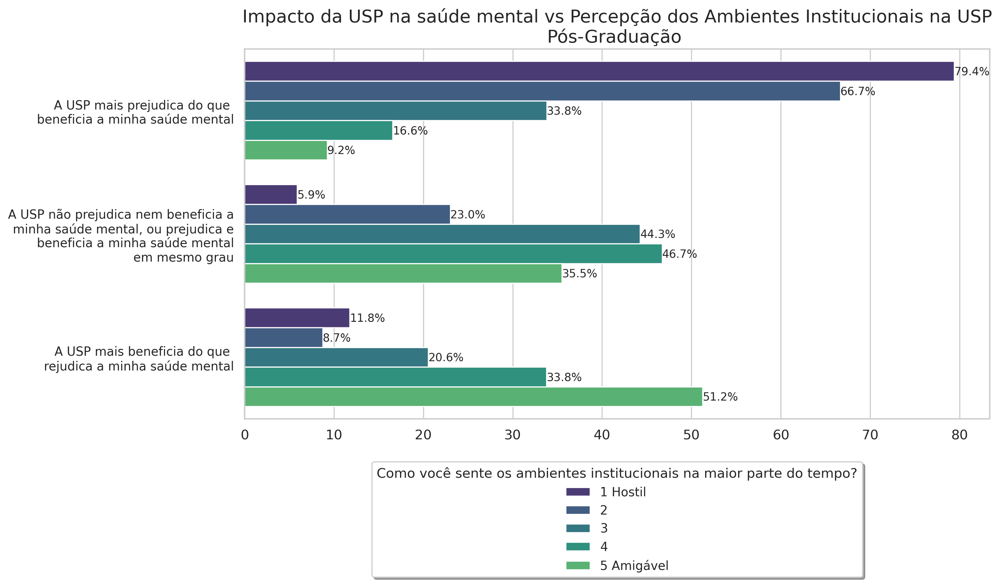

In [ ]:
# Filtrando as respostas "Prefiro não responder"
ambientes_posgrad_filtrado = ambientes_posgrad[ambientes_posgrad['Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?'] != 'Prefiro não responder']

plt.figure(figsize=(12, 6))
plt.rc('xtick', labelsize=12)

ax = sns.barplot(
    data=ambientes_posgrad_filtrado,
    y='Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?',
    x='Respostas',
    hue='A partir da sua experiência dentro do campus da USP, como você sente os ambientes institucionais, na maior parte do tempo?',
    order=[
        'A USP mais prejudica do que beneficia a minha saúde mental',
        'A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau',
        'A USP mais beneficia do que prejudica a minha saúde mental'
    ]
)

for p in ax.patches:
    porcentagem = '{:.1f}%'.format(p.get_width())
    x = p.get_x() + p.get_width()
    y = p.get_y() + p.get_height() / 2 + 0.03
    ax.annotate(porcentagem, (x, y), fontsize = 10)

plt.xlabel("")
plt.ylabel("")
plt.title("Impacto da USP na saúde mental vs Percepção dos Ambientes Institucionais na USP\nPós-Graduação ", size=16)
ax.set_yticklabels(rotulos_quebrados2)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, title = 'Como você sente os ambientes institucionais na maior parte do tempo?',shadow=True, ncol=1)

plt.show()


#### Qui quadrado

In [ ]:
qui_quadrado(df_pos_graduacao, 'Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?', 'A partir da sua experiência dentro do campus da USP, como você sente os ambientes institucionais, na maior parte do tempo?')

,Qui2,p-Valor
"A partir da sua experiência dentro do campus da USP, como você sente os ambientes institucionais, na maior parte do tempo?",304.114377,6.422104e-58


### Pós doutorado

#### Tabela cruzada

In [ ]:
tabcruzada_ambiente_posdoc = pd.crosstab(df_pos_doutorado['Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?'], df_pos_doutorado['A partir da sua experiência dentro do campus da USP, como você sente os ambientes institucionais, na maior parte do tempo?']).reindex(index=q2_row, columns=q3_col_order)
tabcruzada_ambiente_posdoc


"A partir da sua experiência dentro do campus da USP, como você sente os ambientes institucionais, na maior parte do tempo?",1 Hostil,2,3,4,5 Amigável
"Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?",,,,,
A USP mais prejudica do que beneficia a minha saúde mental,1,9,16,6,3
"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",1,2,25,72,37
A USP mais beneficia do que prejudica a minha saúde mental,2,4,13,40,70
Prefiro não responder,0,0,1,6,4


In [ ]:
1,	9,	16,	6,	3,
1,	2,	25,	72,	37,
2,	4,	13,	40,	70,
0,	0,	1,	6, 4))

SyntaxError: unmatched ')' (1781405748.py, line 4)

#### Tabela percentual

In [ ]:
ambientes_posdoutorado = gera_tabela_percentual(df_pos_doutorado,'A partir da sua experiência dentro do campus da USP, como você sente os ambientes institucionais, na maior parte do tempo?', 'Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?')
ambientes_posdoutorado

,index,"A partir da sua experiência dentro do campus da USP, como você sente os ambientes institucionais, na maior parte do tempo?","Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?",Respostas
1,13,1 Hostil,A USP mais beneficia do que prejudica a minha saúde mental,50.00%
2,16,1 Hostil,"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",25.00%
0,15,1 Hostil,A USP mais prejudica do que beneficia a minha saúde mental,25.00%
5,11,2,A USP mais beneficia do que prejudica a minha saúde mental,26.67%
4,7,2,A USP mais prejudica do que beneficia a minha saúde mental,60.00%
3,14,2,"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",13.33%
9,6,3,A USP mais beneficia do que prejudica a minha saúde mental,23.64%
6,17,3,Prefiro não responder,1.82%
7,4,3,"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",45.45%
8,5,3,A USP mais prejudica do que beneficia a minha saúde mental,29.09%


In [ ]:
ambientes_posdoutorado = ambientes_posdoutorado.data

#### Visualização

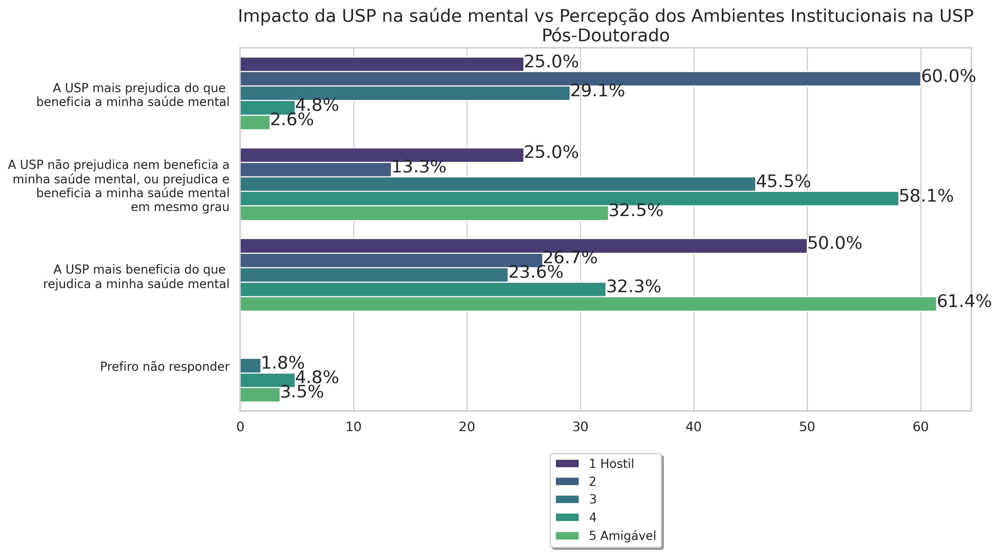

In [ ]:
plt.figure(figsize = (12,6))
plt.rc('xtick', labelsize=12)

ax = sns.barplot(data = ambientes_posdoutorado, y= 'Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?',\
                 x = 'Respostas', hue = 'A partir da sua experiência dentro do campus da USP, como você sente os ambientes institucionais, na maior parte do tempo?', order= ['A USP mais prejudica do que beneficia a minha saúde mental',
 'A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau',
 'A USP mais beneficia do que prejudica a minha saúde mental', 'Em branco'])
for p in ax.patches:
        porcentagem = '{:.1f}%'.format(p.get_width())
        x = p.get_x() + p.get_width()
        y = p.get_y() + p.get_height()/2 + 0.03
        ax.annotate(porcentagem, (x, y))

plt.xlabel("")
plt.ylabel("")
plt.title("Impacto da USP na saúde mental vs Percepção dos Ambientes Institucionais na USP\nPós-Doutorado",size = 16)
ax.set_yticklabels(rotulos_quebrados)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=1)

plt.show()

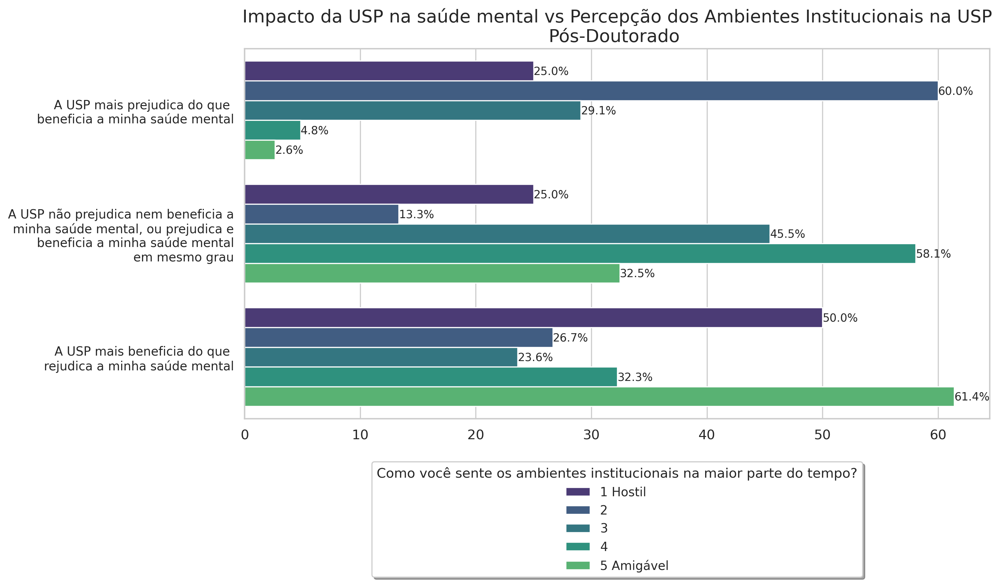

In [ ]:
# Filtrando as respostas "Prefiro não responder"
ambientes_posdoc_filtrado = ambientes_posdoutorado[ambientes_posdoutorado['Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?'] != 'Prefiro não responder']

plt.figure(figsize=(12, 6))
plt.rc('xtick', labelsize=12)

ax = sns.barplot(
    data=ambientes_posdoc_filtrado,
    y='Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?',
    x='Respostas',
    hue='A partir da sua experiência dentro do campus da USP, como você sente os ambientes institucionais, na maior parte do tempo?',
    order=[
        'A USP mais prejudica do que beneficia a minha saúde mental',
        'A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau',
        'A USP mais beneficia do que prejudica a minha saúde mental'
    ]
)

for p in ax.patches:
    porcentagem = '{:.1f}%'.format(p.get_width())
    x = p.get_x() + p.get_width()
    y = p.get_y() + p.get_height() / 2 + 0.03
    ax.annotate(porcentagem, (x, y), fontsize = 10)

plt.xlabel("")
plt.ylabel("")
plt.title("Impacto da USP na saúde mental vs Percepção dos Ambientes Institucionais na USP\nPós-Doutorado ", size=16)
ax.set_yticklabels(rotulos_quebrados2)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, title = 'Como você sente os ambientes institucionais na maior parte do tempo?',shadow=True, ncol=1)

plt.show()


#### Qui quadrado

In [ ]:
qui_quadrado(df_pos_doutorado, 'Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?', 'A partir da sua experiência dentro do campus da USP, como você sente os ambientes institucionais, na maior parte do tempo?')

,Qui2,p-Valor
"A partir da sua experiência dentro do campus da USP, como você sente os ambientes institucionais, na maior parte do tempo?",93.08931,1.242344e-14


### Docentes

#### Tabela cruzada

In [ ]:
tabcruzada_ambiente_docentes = pd.crosstab(df_docentes['Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?'], df_docentes['A partir da sua experiência dentro do campus da USP, como você sente os ambientes institucionais, na maior parte do tempo?']).reindex(index=q2_row, columns=q3_col_order)
tabcruzada_ambiente_docentes

"A partir da sua experiência dentro do campus da USP, como você sente os ambientes institucionais, na maior parte do tempo?",1 Hostil,2,3,4,5 Amigável
"Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?",,,,,
A USP mais prejudica do que beneficia a minha saúde mental,20,60,80,76,21
"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",5,30,88,153,77
A USP mais beneficia do que prejudica a minha saúde mental,3,10,40,135,138
Prefiro não responder,2,3,16,26,17


#### Tabela percentual

In [ ]:
ambientes_docentes = gera_tabela_percentual(df_docentes,'A partir da sua experiência dentro do campus da USP, como você sente os ambientes institucionais, na maior parte do tempo?', percepcao_saudemental)
ambientes_docentes

,index,"A partir da sua experiência dentro do campus da USP, como você sente os ambientes institucionais, na maior parte do tempo?","Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?",Respostas
2,12,1 Hostil,A USP mais prejudica do que beneficia a minha saúde mental,66.67%
3,18,1 Hostil,A USP mais beneficia do que prejudica a minha saúde mental,10.00%
1,16,1 Hostil,"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",16.67%
0,19,1 Hostil,Prefiro não responder,6.67%
5,15,2,A USP mais beneficia do que prejudica a minha saúde mental,9.71%
7,9,2,"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",29.13%
4,17,2,Prefiro não responder,2.91%
6,7,2,A USP mais prejudica do que beneficia a minha saúde mental,58.25%
9,4,3,A USP mais prejudica do que beneficia a minha saúde mental,35.71%
8,8,3,A USP mais beneficia do que prejudica a minha saúde mental,17.86%


In [ ]:
ambientes_docentes = ambientes_docentes.data

#### Visualização

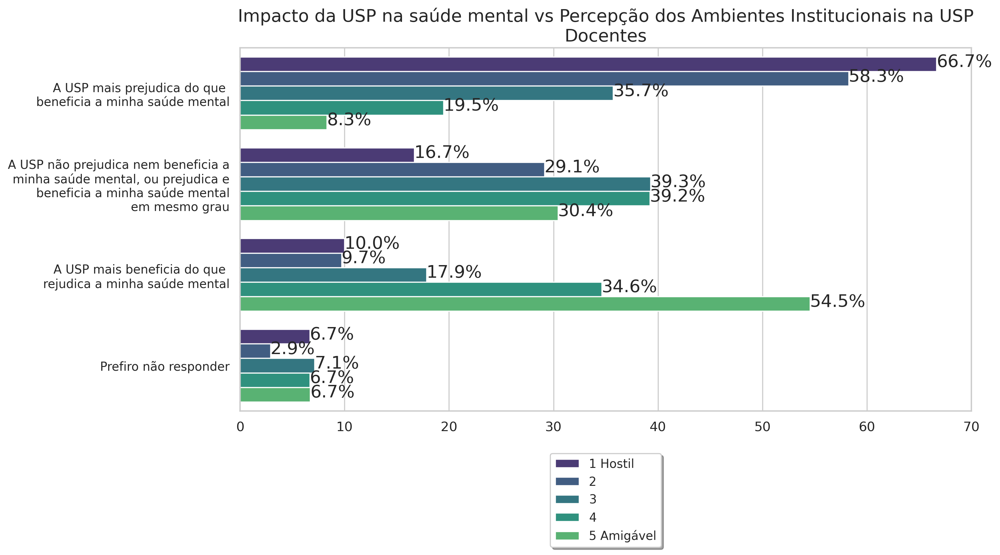

In [ ]:
plt.figure(figsize = (12,6))
plt.rc('xtick', labelsize=12)

ax = sns.barplot(data = ambientes_docentes, y= 'Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?',\
                 x = 'Respostas', hue = 'A partir da sua experiência dentro do campus da USP, como você sente os ambientes institucionais, na maior parte do tempo?', order= ['A USP mais prejudica do que beneficia a minha saúde mental',
 'A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau',
 'A USP mais beneficia do que prejudica a minha saúde mental', 'Prefiro não responder'])
for p in ax.patches:
        porcentagem = '{:.1f}%'.format(p.get_width())
        x = p.get_x() + p.get_width()
        y = p.get_y() + p.get_height()/2 + 0.03
        ax.annotate(porcentagem, (x, y))

plt.xlabel("")
plt.ylabel("")
plt.title("Impacto da USP na saúde mental vs Percepção dos Ambientes Institucionais na USP\nDocentes",size = 16)
ax.set_yticklabels(rotulos_quebrados)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=1)

plt.show()

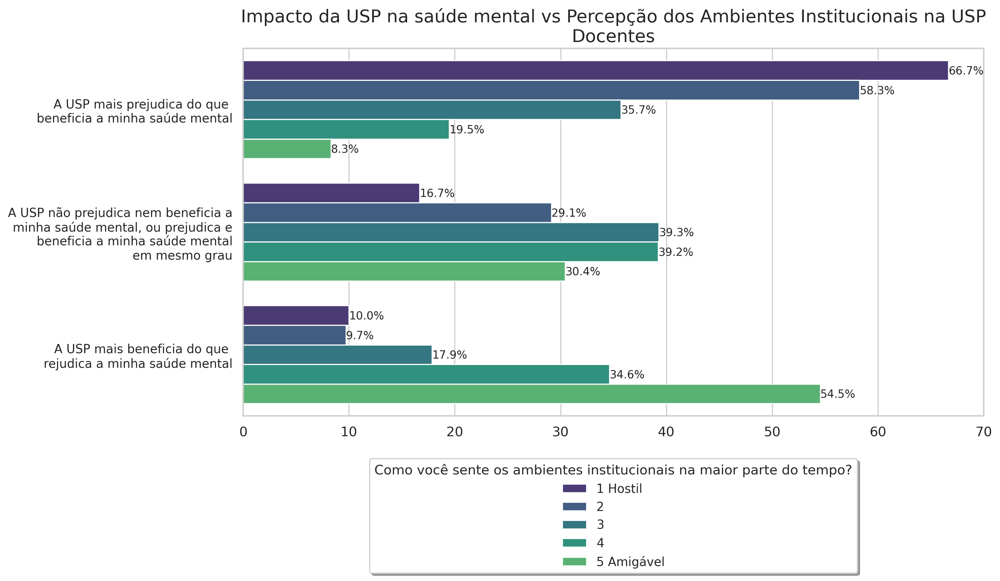

In [ ]:
# Filtrando as respostas "Prefiro não responder"
ambientes_docentes_filtrado = ambientes_docentes[ambientes_docentes['Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?'] != 'Prefiro não responder']

plt.figure(figsize=(12, 6))
plt.rc('xtick', labelsize=12)

ax = sns.barplot(
    data=ambientes_docentes_filtrado,
    y='Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?',
    x='Respostas',
    hue='A partir da sua experiência dentro do campus da USP, como você sente os ambientes institucionais, na maior parte do tempo?',
    order=[
        'A USP mais prejudica do que beneficia a minha saúde mental',
        'A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau',
        'A USP mais beneficia do que prejudica a minha saúde mental'
    ]
)

for p in ax.patches:
    porcentagem = '{:.1f}%'.format(p.get_width())
    x = p.get_x() + p.get_width()
    y = p.get_y() + p.get_height() / 2 + 0.03
    ax.annotate(porcentagem, (x, y), fontsize = 10)

plt.xlabel("")
plt.ylabel("")
plt.title("Impacto da USP na saúde mental vs Percepção dos Ambientes Institucionais na USP\nDocentes", size=16)
ax.set_yticklabels(rotulos_quebrados2)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, title = 'Como você sente os ambientes institucionais na maior parte do tempo?',shadow=True, ncol=1)

plt.show()


#### Qui quadrado

In [ ]:
qui_quadrado(df_docentes, 'Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?', 'A partir da sua experiência dentro do campus da USP, como você sente os ambientes institucionais, na maior parte do tempo?')

,Qui2,p-Valor
"A partir da sua experiência dentro do campus da USP, como você sente os ambientes institucionais, na maior parte do tempo?",191.226043,2.100218e-34


### Funcionários

#### Tabela cruzada

In [ ]:
tabcruzada_ambiente_funcionarios = pd.crosstab(df_funcionarios['Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?'], df_funcionarios['A partir da sua experiência dentro do campus da USP, como você sente os ambientes institucionais, na maior parte do tempo?']).reindex(index=q2_row, columns=q3_col_order)
tabcruzada_ambiente_funcionarios

"A partir da sua experiência dentro do campus da USP, como você sente os ambientes institucionais, na maior parte do tempo?",1 Hostil,2,3,4,5 Amigável
"Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?",,,,,
A USP mais prejudica do que beneficia a minha saúde mental,9,54,80,50,9
"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",2,15,93,169,73
A USP mais beneficia do que prejudica a minha saúde mental,4,17,34,120,155
Prefiro não responder,1,4,19,35,26


#### Tabela percentual

In [ ]:
ambientes_funcionarios = gera_tabela_percentual(df_funcionarios,'A partir da sua experiência dentro do campus da USP, como você sente os ambientes institucionais, na maior parte do tempo?', percepcao_saudemental)
ambientes_funcionarios

,index,"A partir da sua experiência dentro do campus da USP, como você sente os ambientes institucionais, na maior parte do tempo?","Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?",Respostas
0,19,1 Hostil,Prefiro não responder,6.25%
2,14,1 Hostil,A USP mais prejudica do que beneficia a minha saúde mental,56.25%
3,18,1 Hostil,"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",12.50%
1,17,1 Hostil,A USP mais beneficia do que prejudica a minha saúde mental,25.00%
7,6,2,A USP mais prejudica do que beneficia a minha saúde mental,60.00%
5,13,2,"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",16.67%
4,16,2,Prefiro não responder,4.44%
6,12,2,A USP mais beneficia do que prejudica a minha saúde mental,18.89%
10,4,3,A USP mais prejudica do que beneficia a minha saúde mental,35.40%
11,3,3,"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",41.15%


In [ ]:
ambientes_funcionarios = ambientes_funcionarios.data

#### Visualização

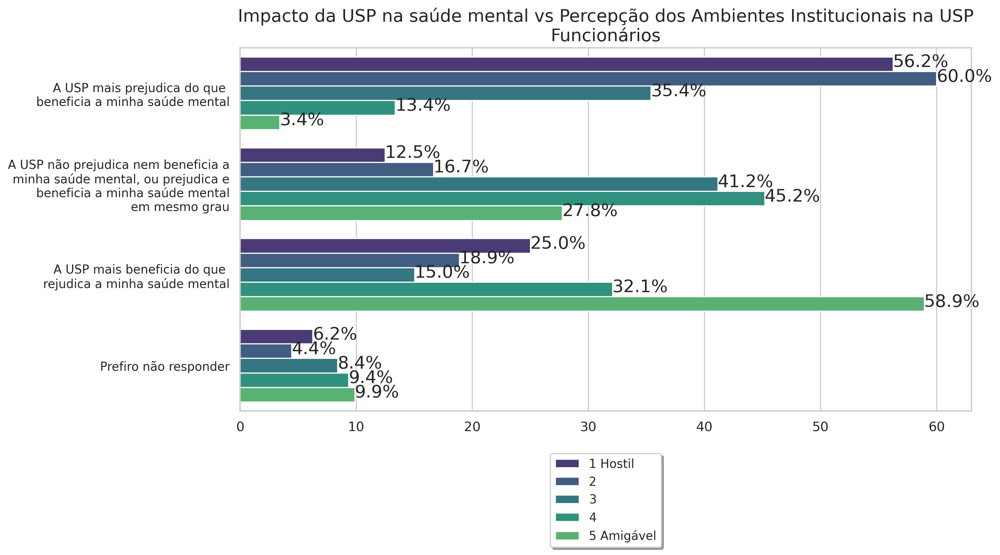

In [ ]:
plt.figure(figsize = (12,6))
plt.rc('xtick', labelsize=12)

ax = sns.barplot(data = ambientes_funcionarios, y= 'Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?',\
                 x = 'Respostas', hue = 'A partir da sua experiência dentro do campus da USP, como você sente os ambientes institucionais, na maior parte do tempo?', order= ['A USP mais prejudica do que beneficia a minha saúde mental',
 'A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau',
 'A USP mais beneficia do que prejudica a minha saúde mental', 'Prefiro não responder'])
for p in ax.patches:
        porcentagem = '{:.1f}%'.format(p.get_width())
        x = p.get_x() + p.get_width()
        y = p.get_y() + p.get_height()/2 + 0.03
        ax.annotate(porcentagem, (x, y))

plt.xlabel("")
plt.ylabel("")
plt.title("Impacto da USP na saúde mental vs Percepção dos Ambientes Institucionais na USP\nFuncionários",size = 16)
ax.set_yticklabels(rotulos_quebrados)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=1)

plt.show()

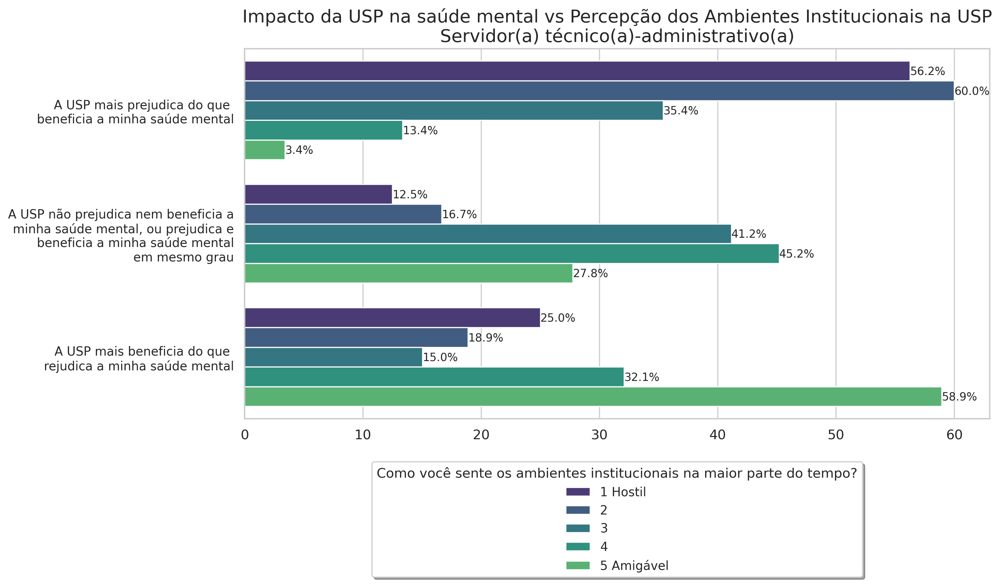

In [ ]:
# Filtrando as respostas "Prefiro não responder"
ambientes_func_filtrado = ambientes_funcionarios[ambientes_funcionarios['Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?'] != 'Prefiro não responder']

plt.figure(figsize=(12, 6))
plt.rc('xtick', labelsize=12)

ax = sns.barplot(
    data=ambientes_func_filtrado,
    y='Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?',
    x='Respostas',
    hue='A partir da sua experiência dentro do campus da USP, como você sente os ambientes institucionais, na maior parte do tempo?',
    order=[
        'A USP mais prejudica do que beneficia a minha saúde mental',
        'A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau',
        'A USP mais beneficia do que prejudica a minha saúde mental'
    ]
)

for p in ax.patches:
    porcentagem = '{:.1f}%'.format(p.get_width())
    x = p.get_x() + p.get_width()
    y = p.get_y() + p.get_height() / 2 + 0.03
    ax.annotate(porcentagem, (x, y), fontsize = 10)

plt.xlabel("")
plt.ylabel("")
plt.title("Impacto da USP na saúde mental vs Percepção dos Ambientes Institucionais na USP\nServidor(a) técnico(a)-administrativo(a)", size=16)
ax.set_yticklabels(rotulos_quebrados2)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, title = 'Como você sente os ambientes institucionais na maior parte do tempo?',shadow=True, ncol=1)

plt.show()


#### Qui quadrado

In [ ]:
qui_quadrado(df_funcionarios, 'Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?', 'A partir da sua experiência dentro do campus da USP, como você sente os ambientes institucionais, na maior parte do tempo?')

,Qui2,p-Valor
"A partir da sua experiência dentro do campus da USP, como você sente os ambientes institucionais, na maior parte do tempo?",255.291042,1.077242e-47


---

## Questão 04

**Na sua opinião, o que motiva/motivou esse comportamento?**

### Geral

Note que por ser uma pergunta aberta, viu-se necessário estabelecer alguns rótulos (baseado no notebook de expriências pessoais) para filtrar as respostas mais relevantes

In [ ]:
df['Na sua opinião, o que motiva/motivou esse comportamento?'].unique().tolist()

['Prefiro não responder.',
 'Não se aplica.',
 'Poder hierárquico e a sensação que alguns professores têm de serem donos do universo. Fora a competitividade entre os alunos que é constantemente incentivada. A USP não é uma comunidade na minha visão, a universidade é um "jogos vorazes" e sobrevive quem tem menos escrúpulos. ',
 'Minha condição socioeconômica, Dificuldade de aprendizagem, Meu desempenho acadêmico, Etnia/Raça',
 'Não sei',
 'Gênero/identidade de gênero',
 'Dificuldade de aprendizagem',
 'Visões políticas, Visões religiosas/espirituais',
 'Minha condição socioeconômica, Meu desempenho acadêmico, Dificuldade de aprendizagem',
 'Meu desempenho acadêmico',
 'Minha condição socioeconômica',
 'Meu desempenho acadêmico, Etnia/Raça',
 'Etnia/Raça, Visões religiosas/espirituais, Meu desempenho acadêmico, Minha condição socioeconômica',
 'Minha condição socioeconômica, Orientação sexual, Gênero/identidade de gênero',
 'Minha condição socioeconômica, Dificuldade de aprendizagem',
 '

In [ ]:
possiveis_motivacoes = ['Minha condição socioeconômica',
                            'Uma deficiência física',
                            'Meu desempenho acadêmico',
                            'Dificuldade de aprendizagem',
                            'Estado civil/conjugal',
                            'Etnia/Raça',
                            'Gênero/identidade de gênero',
                            'Gestação',
                            'Idade',
                            'Orientação sexual',
                            'Estado parental (ter ou não ter filhos)',
                            'Visões políticas',
                            'Visões religiosas/espirituais',
                            'Minha nacionalidade/meu país de origem',
                            'Não sei',
                            'Prefiro não responder',
                            'Outro',
                            ]

In [ ]:
respostas_geral = np.zeros(len(possiveis_motivacoes))

for i in df['Na sua opinião, o que motiva/motivou esse comportamento?']:
  for j in possiveis_motivacoes:
    if j in i:
      respostas_geral[possiveis_motivacoes.index(j)] += 1


motivacoes_geral = pd.DataFrame({'Na sua opinião, o que motiva/motivou esse comportamento?': possiveis_motivacoes, 'Respostas': respostas_geral})

motivacoes_geral['Respostas'] /= df[df['Na sua opinião, o que motiva/motivou esse comportamento?'] != 'Em branco'].iloc[:, 2].shape[0]
motivacoes_geral['Respostas'] *=100
analise_motivacoes_geral = motivacoes_geral.sort_values(by = 'Respostas', ascending = False)
analise_motivacoes_geral = analise_motivacoes_geral.style.format({"Respostas": "{:,.2f}%"})
analise_motivacoes_geral

,"Na sua opinião, o que motiva/motivou esse comportamento?",Respostas
6,Gênero/identidade de gênero,9.89%
2,Meu desempenho acadêmico,8.46%
0,Minha condição socioeconômica,7.55%
15,Prefiro não responder,6.64%
5,Etnia/Raça,6.54%
11,Visões políticas,6.32%
3,Dificuldade de aprendizagem,4.66%
14,Não sei,4.29%
8,Idade,3.99%
9,Orientação sexual,2.85%


In [ ]:

# filtrar para utilizar as respostas dentre os rótulos "possíveis motivacoes"
df_filtrado = df[df['Na sua opinião, o que motiva/motivou esse comportamento?'].isin(possiveis_motivacoes)]

# tabela de contingência para o DataFrame filtrado
tabela_motivacoes_geral = gera_tabela_percentual(df_filtrado, 'Na sua opinião, o que motiva/motivou esse comportamento?', percepcao_saudemental)

# Exiba a tabela estilizada
tabela_motivacoes_geral


,index,"Na sua opinião, o que motiva/motivou esse comportamento?","Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?",Respostas
0,16,Dificuldade de aprendizagem,A USP mais prejudica do que beneficia a minha saúde mental,57.89%
2,26,Dificuldade de aprendizagem,"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",28.95%
3,41,Dificuldade de aprendizagem,A USP mais beneficia do que prejudica a minha saúde mental,10.53%
1,57,Dificuldade de aprendizagem,Prefiro não responder,2.63%
5,49,Estado civil/conjugal,"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",40.00%
6,50,Estado civil/conjugal,A USP mais beneficia do que prejudica a minha saúde mental,40.00%
4,56,Estado civil/conjugal,A USP mais prejudica do que beneficia a minha saúde mental,20.00%
9,14,Etnia/Raça,"A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau",25.81%
7,5,Etnia/Raça,A USP mais prejudica do que beneficia a minha saúde mental,48.39%
8,15,Etnia/Raça,A USP mais beneficia do que prejudica a minha saúde mental,25.81%


## Rascunho

### Tentanto likert

/home/jpirolla/anaconda3/lib/python3.10/site-packages/plot_likert/plot_likert.py:313: UserWarning: In your data, not all questions have the same number of responses. i.e., different numbers of people answered each question. Therefore, the percentages aren't directly comparable: X% for one question represents a different number of responses than X% for another question, yet they will appear the same in the percentage graph. This may be misleading to your reader.
  warn(


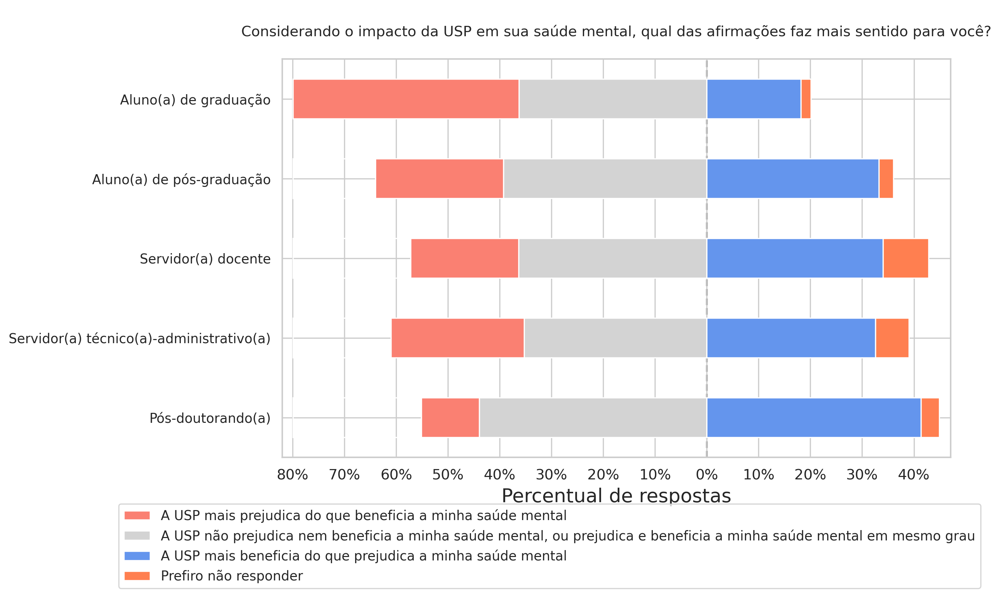

In [ ]:
cores =[
    plot_likert.colors.TRANSPARENT,
    "salmon",
    "lightgray",
    "cornflowerblue",
    "coral"
]

sns.set_style("whitegrid")
myscale5 = ['A USP mais prejudica do que beneficia a minha saúde mental','A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau','A USP mais beneficia do que prejudica a minha saúde mental', 'Prefiro não responder']


tabela = tabela.reindex(['SaudeMental:Grad','SaudeMental:Posgrad', 'SaudeMental:Func', 'SaudeMental:Doc', 'SaudeMental:Posdoc'], axis=1)


plt.rc('font', size=16)

ax = plot_likert.plot_likert(tabela[tabela!= 'NaN'],
                             myscale5, figsize=(10,6), title = '\nConsiderando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?\n', colors = cores , plot_percentage=True)

ax.legend(loc='upper center', bbox_to_anchor=(0.4, -0.1),
          fancybox=True, shadow=False, ncol=1)

ax.set_xlabel('Percentual de respostas')

ax.set_yticklabels(['Pós-doutorando(a)', 'Servidor(a) técnico(a)-administrativo(a)', 'Servidor(a) docente', 'Aluno(a) de pós-graduação', 'Aluno(a) de graduação'])


plt.show()

/home/jpirolla/anaconda3/lib/python3.10/site-packages/plot_likert/plot_likert.py:313: UserWarning: In your data, not all questions have the same number of responses. i.e., different numbers of people answered each question. Therefore, the percentages aren't directly comparable: X% for one question represents a different number of responses than X% for another question, yet they will appear the same in the percentage graph. This may be misleading to your reader.
  warn(


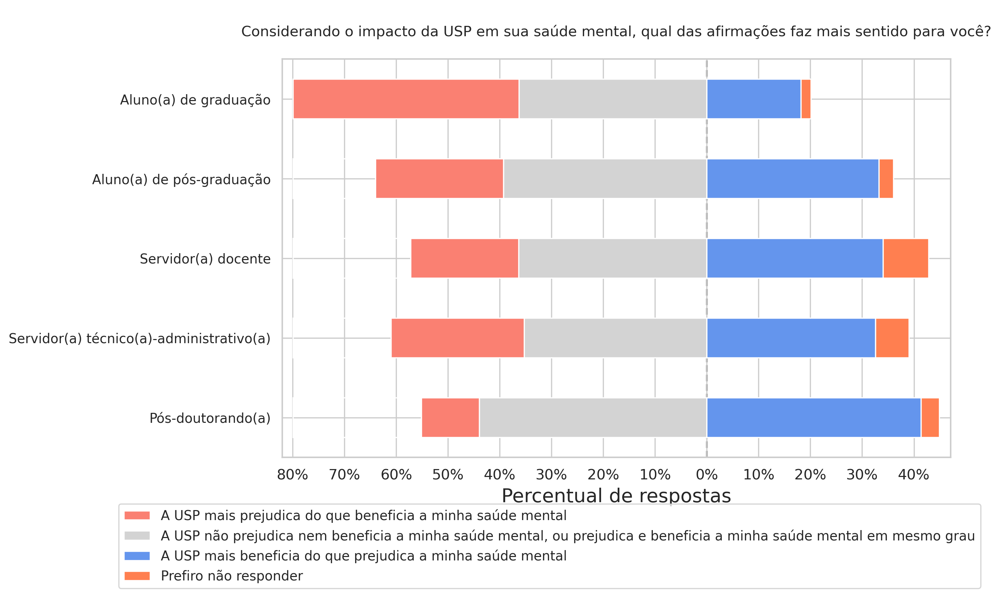

In [ ]:
cores =[
    plot_likert.colors.TRANSPARENT,
    "salmon",
    "lightgray",
    "cornflowerblue",
    "coral"
]

sns.set_style("whitegrid")
myscale5 = ['A USP mais prejudica do que beneficia a minha saúde mental','A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau','A USP mais beneficia do que prejudica a minha saúde mental', 'Prefiro não responder']


tabela = tabela.reindex(['SaudeMental:Grad','SaudeMental:Posgrad', 'SaudeMental:Func', 'SaudeMental:Doc', 'SaudeMental:Posdoc'], axis=1)


plt.rc('font', size=16)

ax = plot_likert.plot_likert(tabela[tabela!= 'NaN'],
                             myscale5, figsize=(10,6), title = '\nConsiderando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?\n', colors = cores , plot_percentage=True)

ax.legend(loc='upper center', bbox_to_anchor=(0.4, -0.1),
          fancybox=True, shadow=False, ncol=1)

ax.set_xlabel('Percentual de respostas')

ax.set_yticklabels(['Pós-doutorando(a)', 'Servidor(a) técnico(a)-administrativo(a)', 'Servidor(a) docente', 'Aluno(a) de pós-graduação', 'Aluno(a) de graduação'])


plt.show()

In [ ]:
# Preencher os valores nulos no DataFrame original
df_pos_graduacao['Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?'].fillna('Prefiro não responder', inplace=True)
df_pos_graduacao['Você é atualmente dependente financeiramente (família/responsável está ajudando com suas despesas) ou independente (você é o único provedor para as suas despesas)?'].fillna('Prefiro não responder', inplace=True)


tabcruzada_independencia_grad = pd.crosstab(df_graduacao['Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?'], df_graduacao['Você é atualmente dependente financeiramente (família/responsável está ajudando com suas despesas) ou independente (você é o único provedor para as suas despesas)?'])
tabcruzada_independencia_grad


qui_quadrado(df_graduacao,'Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?','Você é atualmente dependente financeiramente (família/responsável está ajudando com suas despesas) ou independente (você é o único provedor para as suas despesas)?')

,Qui2,p-Valor
Você é atualmente dependente financeiramente (família/responsável está ajudando com suas despesas) ou independente (você é o único provedor para as suas despesas)?,28.696504,0.000069


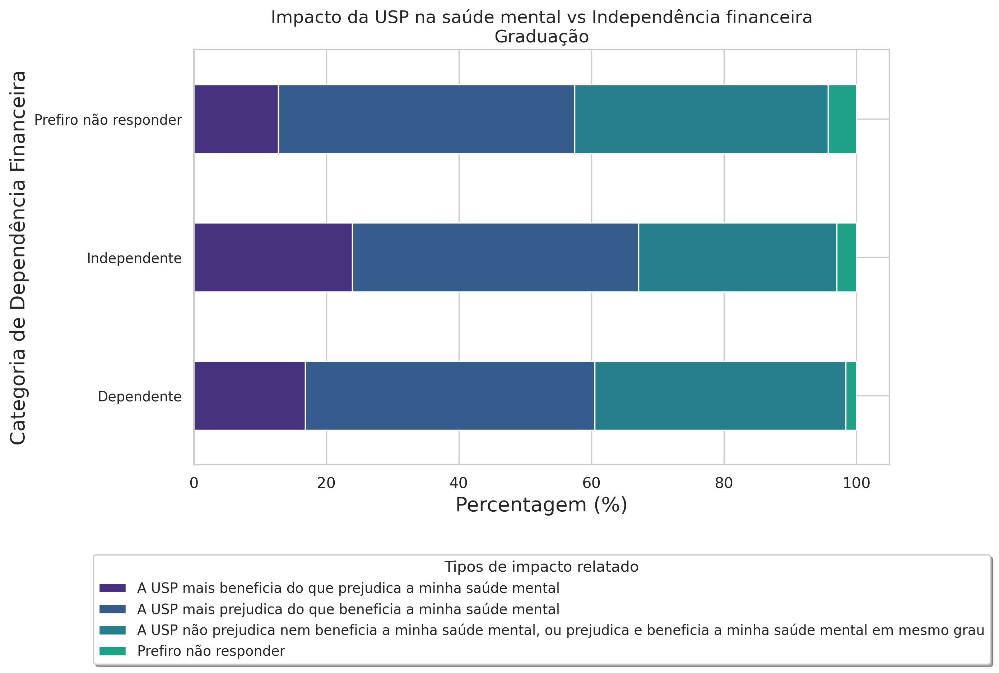

In [ ]:
# visualizacao


analise_graduacao = df_graduacao[['Você é atualmente dependente financeiramente (família/responsável está ajudando com suas despesas) ou independente (você é o único provedor para as suas despesas)?',
                                   'Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?']].copy()

analise_graduacao.rename(columns={'Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?': 'afirmacao_impacto',
                                  'Você é atualmente dependente financeiramente (família/responsável está ajudando com suas despesas) ou independente (você é o único provedor para as suas despesas)?': 'independencia'}, inplace=True)

analise_graduacao['afirmacao_impacto'].fillna('Prefiro não responder', inplace=True)

afirmacao_value_counts_graduacao = analise_graduacao['afirmacao_impacto'].value_counts()

df_count_graduacao = analise_graduacao.groupby(['independencia', 'afirmacao_impacto']).size().unstack().fillna(0)

df_normalized_graduacao = df_count_graduacao.div(df_count_graduacao.sum(axis=1), axis=0) * 100

# Plotar o gráfico de barras empilhadas
ax_graduacao = df_normalized_graduacao.plot(kind='barh', stacked=True, figsize=(10, 6))

plt.title('Impacto da USP na saúde mental vs Independência financeira\nGraduação', fontsize=14)
plt.xlabel('Percentagem (%)')
plt.ylabel('Categoria de Dependência Financeira')
plt.legend(title='Tipos de impacto relatado', bbox_to_anchor=(0.5, -0.2), loc='upper center', fancybox=True, shadow=True, ncol=1)

plt.show()


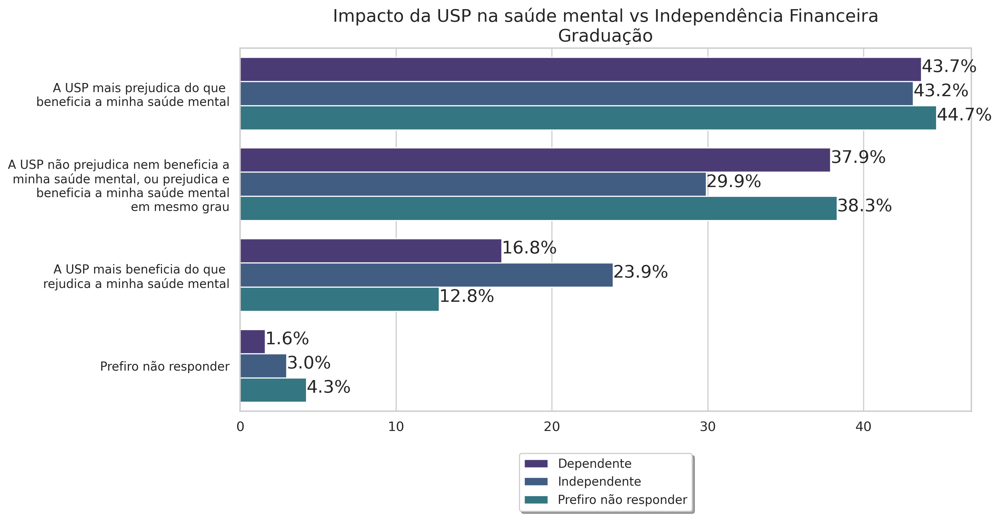

In [ ]:
# visualização 2
independencia_grad = gera_tabela_percentual(df_graduacao, 'Você é atualmente dependente financeiramente (família/responsável está ajudando com suas despesas) ou independente (você é o único provedor para as suas despesas)?', percepcao_saudemental)
independencia_grad =independencia_grad.data


plt.figure(figsize=(12, 6))
plt.rc('xtick', labelsize=12)

ax = sns.barplot(data=independencia_grad, y='Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?',
                 x='Respostas', hue='Você é atualmente dependente financeiramente (família/responsável está ajudando com suas despesas) ou independente (você é o único provedor para as suas despesas)?',
                 order=['A USP mais prejudica do que beneficia a minha saúde mental',
                        'A USP não prejudica nem beneficia a minha saúde mental, ou prejudica e beneficia a minha saúde mental em mesmo grau',
                        'A USP mais beneficia do que prejudica a minha saúde mental', 'Prefiro não responder'])
for p in ax.patches:
    porcentagem = '{:.1f}%'.format(p.get_width())
    x = p.get_x() + p.get_width()
    y = p.get_y() + p.get_height() / 2 + 0.03
    ax.annotate(porcentagem, (x, y))

plt.xlabel("")
plt.ylabel("")
plt.title("Impacto da USP na saúde mental vs Independência Financeira\nGraduação", size=16)
ax.set_yticklabels(rotulos_quebrados)
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.1), fancybox=True, shadow=True, ncol=1)
plt.show()


### Pós-Graduação

#### Barras empilhadas

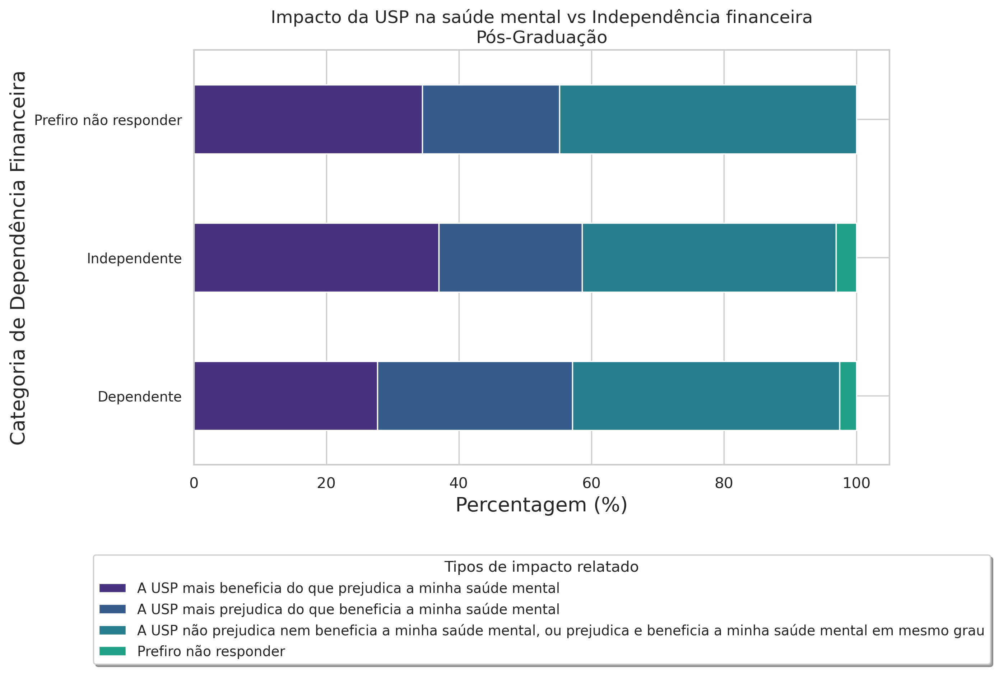

In [ ]:
# visualizacao


analise_posgraduacao = df_pos_graduacao[['Você é atualmente dependente financeiramente (família/responsável está ajudando com suas despesas) ou independente (você é o único provedor para as suas despesas)?',
                                   'Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?']].copy()

analise_posgraduacao.rename(columns={'Considerando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?': 'afirmacao_impacto',
                                  'Você é atualmente dependente financeiramente (família/responsável está ajudando com suas despesas) ou independente (você é o único provedor para as suas despesas)?': 'independencia'}, inplace=True)

analise_posgraduacao['afirmacao_impacto'].fillna('Prefiro não responder', inplace=True)

afirmacao_value_counts_posgraduacao = analise_posgraduacao['afirmacao_impacto'].value_counts()

df_count_posgraduacao = analise_posgraduacao.groupby(['independencia', 'afirmacao_impacto']).size().unstack().fillna(0)

df_normalized_posgraduacao = df_count_posgraduacao.div(df_count_posgraduacao.sum(axis=1), axis=0) * 100

# Plotar o gráfico de barras empilhadas
ax_posgraduacao = df_normalized_posgraduacao.plot(kind='barh', stacked=True, figsize=(10, 6))

plt.title('Impacto da USP na saúde mental vs Independência financeira\nPós-Graduação', fontsize=14)
plt.xlabel('Percentagem (%)')
plt.ylabel('Categoria de Dependência Financeira')
plt.legend(title='Tipos de impacto relatado', bbox_to_anchor=(0.5, -0.2), loc='upper center', fancybox=True, shadow=True, ncol=1)

plt.show()


In [ ]:
from likertpy import likert_scale

ModuleNotFoundError: No module named 'likertpy'

In [ ]:

# Reorganizar os dados para o formato de escala Likert
likert_data_posgraduacao = df_normalized_posgraduacao.reset_index()
likert_data_posgraduacao = likert_data_posgraduacao.melt(id_vars='independencia', var_name='afirmacao_impacto', value_name='percentagem')

# Mapear as categorias de dependência financeira para uma ordem específica (opcional)
dependence_order = ['Independente', 'Dependente']

# Criar o gráfico Likert
ax = plot_likert.plot_likert(likert_data_posgraduacao[likert_data_posgraduacao != 'NaN'],
                    myscale5, figsize=(10, 6),
                    title='\nConsiderando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?\n',
                    colors=cores,
                    plot_percentage=True)

# Ajustar o layout
ax.set_xlabel('Percentagem (%)')
ax.set_ylabel('Categoria de Dependência Financeira')

# Exibir o gráfico
plt.show()



AttributeError: 'function' object has no attribute 'plot_likert'

In [ ]:
import pandas as pd
import plotlikert.plot_likert as pl

# Reorganizar os dados para o formato de escala Likert
likert_data_posgraduacao = df_normalized_posgraduacao.reset_index()
likert_data_posgraduacao = likert_data_posgraduacao.melt(id_vars='independencia', var_name='afirmacao_impacto', value_name='percentagem')

# Mapear as categorias de dependência financeira para uma ordem específica (opcional)
dependence_order = ['Independente', 'Dependente']

# Criar o gráfico Likert
ax = pl.plot_likert(likert_data_posgraduacao,
                    scale=myscale5,
                    figsize=(10, 6),
                    title='\nConsiderando o impacto da USP em sua saúde mental, qual das afirmações faz mais sentido para você?\n',
                    colors=cores,
                    plot_percentage=True)

# Ajustar o layout
ax.set_xlabel('Percentagem (%)')
ax.set_ylabel('Categoria de Dependência Financeira')

# Exibir o gráfico
plt.show()


ModuleNotFoundError: No module named 'plotlikert'

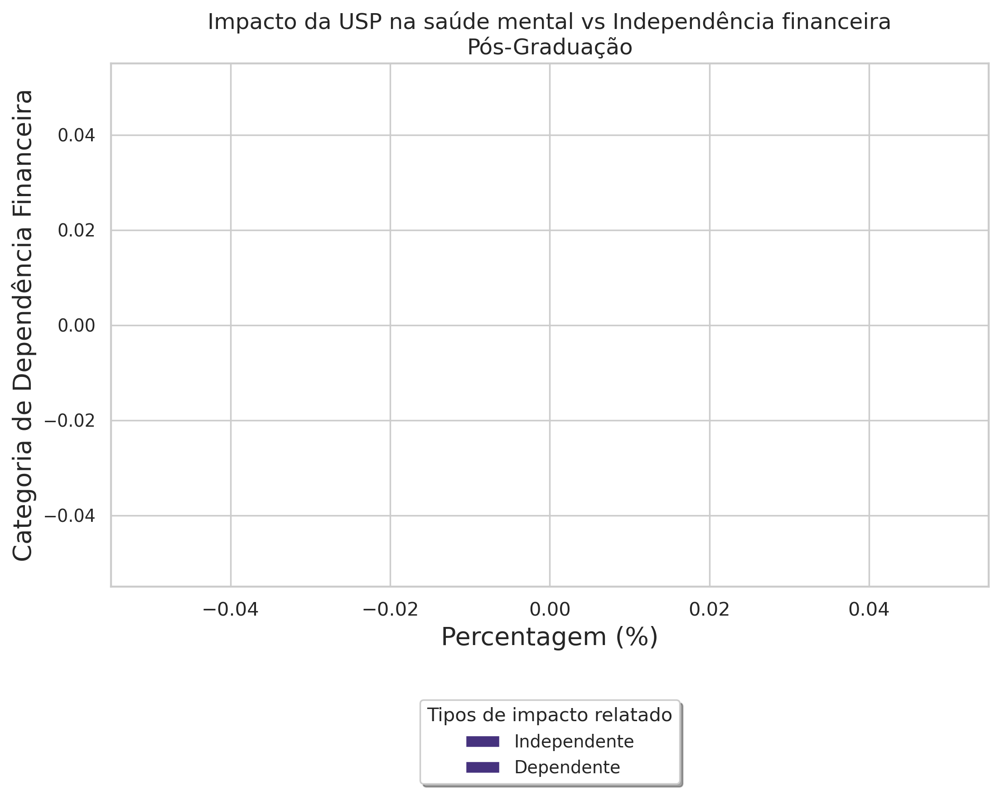

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming likert_data_posgraduacao is your DataFrame with Likert data

# Reorganizar os dados para o formato de escala Likert
likert_data_posgraduacao = df_normalized_posgraduacao.reset_index()
likert_data_posgraduacao = likert_data_posgraduacao.melt(id_vars='independencia', var_name='afirmacao_impacto', value_name='percentagem')

# Mapear as categorias de dependência financeira para uma ordem específica (opcional)
dependence_order = ['Independente', 'Dependente']

# Criar o gráfico Likert
fig, ax = plt.subplots(figsize=(10, 6))

# Define uma função para desenhar barras Likert
def plot_likert(ax, data, category_order, colors):
    for i, category in enumerate(category_order):
        subset = data[data['afirmacao_impacto'] == category]
        bars = ax.barh(subset['independencia'], subset['percentagem'], color=colors[i], edgecolor='black', label=category)

        # Adicionar rótulos no meio das barras
        for bar in bars:
            width = bar.get_width()
            label_x_pos = width / 2
            ax.text(label_x_pos, bar.get_y() + bar.get_height()/2, f'{width:.1f}%', ha='center', va='center', color='white')

# Chamar a função de plotagem Likert
plot_likert(ax, likert_data_posgraduacao, dependence_order, ['#E41A1C', '#377EB8', '#4DAF4A', '#FF7F00'])

# Ajustar o layout
plt.title('Impacto da USP na saúde mental vs Independência financeira\nPós-Graduação', fontsize=14)
plt.xlabel('Percentagem (%)')
plt.ylabel('Categoria de Dependência Financeira')
plt.legend(title='Tipos de impacto relatado', bbox_to_anchor=(0.5, -0.2), loc='upper center', fancybox=True, shadow=True, ncol=1)

# Exibir o gráfico
plt.show()


### Pós-Doutorado

### Docentes

### Funcionários